# Prediction of the Box-Counting Dimension of Metal Nanoparticles: Models Training and Evaluation (Data-Driven Reduction)

This notebook contains the models training and evaluation results from the machine learning predictions of the box-counting dimensions, $D_B$, computed for monometallic gold, palladium, and platinum nanoparticles, in attempt to explore the possibility of using a machine learning model to compute the $D_B$ values to save computational costs. The feature importance profiles are also studied to investigate the most influential features in the prediction of the $D_B$ of metal nanoparticles.

The $D_B$ values are computed using [Sphractal](https://github.com/jon-ting/sphractal), a Python package for the estimation of the fractal dimension of the surfaces of atomistic objects via box-counting approaches.

## Outline

[Notebook Setups](#setup)

[Monometallic Nanoparticles](#mnps)

<a id='setup'></a>
## Notebook Setups

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Import relevant libraries
from os import chdir, listdir
from os.path import exists
import pickle
import warnings

import lightgbm
import scipy
import seaborn as sns
import sklearn

from lightgbm import LGBMRegressor
from natsort import natsorted
from scipy import stats
# from sklearnex import patch_sklearn; 
# patch_sklearn()
from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

from sklearn.linear_model import ElasticNetCV, LassoLarsCV, LinearRegression, RidgeCV  # To be removed after debugging

chdir('/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/strategicInf')
from trainEvalModels import *

# Print package versions for reproducibility
print('Versions of imported libraries:')
print(f"  lightgbm: {lightgbm.__version__}")
print(f"  matplotlib: {mpl.__version__}")
print(f"  numpy: {np.__version__}")
print(f"  pandas: {pd.__version__}")
print(f"  scipy: {scipy.__version__}")
print(f"  scikit-learn: {sklearn.__version__}")
print(f"  seaborn: {sns.__version__}")

Versions of imported libraries:
  lightgbm: 4.2.0
  matplotlib: 3.8.2
  numpy: 1.24.4
  pandas: 2.1.4
  scipy: 1.11.4
  scikit-learn: 1.4.0
  seaborn: 0.13.1


Below are some general settings for plotting figures:

In [3]:
# Settings for figures
sns.set_theme(context='paper', style='ticks', palette='colorblind', font='sans-serif', font_scale=1, color_codes=True, rc=None)  # Options are: {paper, notebook, talk, poster}
figSize, fontSize, labelSize = (3.5, 2.5), 'medium', 'small'
legendSize, lineWidth, markerSize = 'x-small', 1, 3
# SMALL_SIZE, MEDIUM_SIZE, LARGE_SIZE, TITLE_SIZE = 8, 10, 12, 14
# plt.rc('font', size=LARGE_SIZE)  # controls default text sizes
# plt.rc('axes', titlesize=TITLE_SIZE)  # fontsize of the axes title
# plt.rc('axes', labelsize=LARGE_SIZE)  # fontsize of the x and y labels
# plt.rc('xtick', labelsize=LARGE_SIZE)  # fontsize of the tick labels
# plt.rc('ytick', labelsize=LARGE_SIZE)  # fontsize of the tick labels
# plt.rc('legend', fontsize=LARGE_SIZE)  # legend fontsize
# plt.rc('figure', titlesize=TITLE_SIZE)  # fontsize of the figure title

In [4]:
# Global variables
SCALING = 'minmax'  # {None, 'minmax', 'standard', 'yeo-johnson'}
POLY_FEATS = False
NUM_JOBS = 48
VERBOSE = True
RANDOM_SEED = 42
NUM_RUNS = 10

DATA_DIR = '/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/data'
FIG_DIR = '/scratch/q27/jt5911/metal-nanoparticle-causal-path-probability/figs'

In [5]:
def rmNullFeats(featsDF, verbose=False):
    if verbose:
        print(f"Removing the features with null values...")
        print(f"  Original number of features: {len(featsDF.columns)}")
    featsToDrop = []
    for feat in featsDF.columns:
        if featsDF[feat].isnull().any():
            featsToDrop.append(feat)
    featsNoNullDF = featsDF.drop(featsToDrop, axis=1, inplace=False)
    if verbose:
        print(f"  Total number of features left: {len(featsNoNullDF.columns)}\n")
    return featsNoNullDF

In [6]:
def genModel(hpValDict, modelName):
    if modelName == 'RFR':
        kwargs = {'n_estimators': 100, 'criterion': 'squared_error', 
                  # Adjust to deal with overfitting and speed up training
                  'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 
                  'min_samples_split': 2, 'min_samples_leaf': 1, 'min_impurity_decrease': 0.0, 'ccp_alpha': 0.0, 
                  # Parameters to be fixed
                  'min_weight_fraction_leaf': 0.0, 'bootstrap': True, 'warm_start': False, 
                  'monotonic_cst': None, 'oob_score': False, 'n_jobs': NUM_JOBS, 'random_state': RANDOM_SEED, 'verbose': 0}
    elif modelName == 'LGB':
        kwargs = {'num_leaves': 31, 'min_child_samples': 20, 'learning_rate': 0.1, 'n_estimators': 100, 
                  # Adjust to deal with overfitting
                  'min_child_weight': 0.001, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 
                  'subsample': 1.0, 'subsample_freq': 0, 'colsample_bytree': 1.0, 
                  # Adjust to speed up training
                  'min_split_gain': 0.0, 'subsample_for_bin': 200000, 'max_bin': 255, 'max_depth': -1, 
                  # Parameters to be fixed
                  'boosting_type': 'gbdt', 'importance_type': 'gain', 'tree_learner': 'data', 
                  'objective': 'regression', 'class_weight': None, 'use_missing': True,
                  'random_state': RANDOM_SEED, 'n_jobs': NUM_JOBS, 'force_row_wise': True, 'verbose': -1}

    for hp in hpValDict.keys():
        kwargs[hp] = hpValDict[hp]
        
    if modelName == 'RFR':
        return RandomForestRegressor(**kwargs)
    elif modelName == 'LGB':
        return LGBMRegressor(**kwargs)

In [7]:
def getTrainTestScores(dataset, hpsValsDicts, modelName):
    Xtrain, Xtest, yTrain, yTest = dataset
    trainScores, testScores = [], []
    for hpsValsDict in hpsValsDicts:
        reg = genModel(hpsValsDict, modelName)
        reg.fit(Xtrain, yTrain)
        trainScores.append(reg.score(Xtrain, yTrain))
        testScores.append(reg.score(Xtest, yTest))
    return trainScores, testScores

In [8]:
def hpVSr2(xVals, scores, xlabel, figSize=(7, 2.5)):
    mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=['#303F9F', '#FF5252', '#D32F2F'])
    if len(scores) == 1:
        trainScores, testScores = scores[0]
        plt.figure(figsize=figSize)
        if all(isinstance(xVal, str) for xVal in xVals):
            plt.bar(xVals, trainScores)
            plt.bar(xVals, testScores)
        else:
            plt.plot(xVals, trainScores)
            plt.plot(xVals, testScores)
            plt.xlabel(xlabel)
        plt.grid(linestyle='dotted')
        plt.ylabel('R2 score')
        plt.legend(['Train', 'Test']);
    else:
        fig, axes = plt.subplots(1, len(scores), figsize=figSize)
        for i, (trainScores, testScores) in enumerate(scores):
            if all(isinstance(xVal, str) for xVal in xVals):
                axes[i].bar(xVals, trainScores)
                axes[i].bar(xVals, testScores)
            else:
                axes[i].plot(xVals, trainScores)
                axes[i].plot(xVals, testScores)
            axes[i].grid(linestyle='dotted')
            axes[i].legend(['Train', 'Test'])
        fig.text(0.5, -0.03, xlabel, ha='center')
        fig.text(0.05, 0.5, 'R2 score', va='center', rotation='vertical');

<a id='mnps'></a>
## Monometallic Nanoparticles

Here we attempt to train a machine learning model that aims to predict the $D_B$ values of a set of simulated monometallic nanoparticles (either gold, palladium, or platinum), study the feature importance profile to understand the influential features in the prediction of the $D_B$ values, and investigate the conditions that give rise to rougher nanoparticles.

In [9]:
def loadFeats(pklFilePath):
    """
    Load feature dataframe saved in pickle file.
    """
    with open(pklFilePath, 'rb') as f:
        featsDF = pickle.load(f)
    return featsDF

In [10]:
CORR_THRESH = 0.8
MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}.pickle")
MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
reducedMNPFeatsDF = loadFeats(f"{DATA_DIR}/reducedMNP_nanoparticle_data.pkl")
noArchMNPDF = MNPDF.drop(index=reducedMNPFeatsDF.index)
NUM_SAMPLES = np.linspace(0, noArchMNPDF.shape[0], NUM_RUNS, dtype=int)

Removing the features with null values...
  Original number of features: 57
  Total number of features left: 57



In [19]:
train = MNPDF.sample(n=250, random_state=42 + 1)

MNPDF[~]

,T,time,tau,MM_SCN_avg,q6q6_avg_surf,S_100,S_111,S_110,S_311,N_atom_surface,...,MM_BCN_6,MM_BCN_7,MM_BCN_8,MM_BCN_9,q6q6_B_3,q6q6_B_4,q6q6_B_6,q6q6_B_8,q6q6_B_10,DBoxEX


In [11]:
CORR_THRESH = 0.8

MNPDF1 = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}.pickle")
MNPDF2 = pd.read_pickle(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}.pickle")
# Total Energy
MNPDF = MNPDF2.iloc[MNPDF1.index, :].iloc[:, :-1] 

In [12]:
MNPDF

,T,tau,time,N_atom_total,Volume,R_diff,R_skew,R_kurt,S_100,S_111,...,DECA,q6q6_avg_total,q6q6_T_4,q6q6_T_6,q6q6_T_13,q6q6_T_14,q6q6_T_15,q6q6_S_12,q6q6_S_13,Total_E
3008,823,0.000025,9,14002,0.000004,0.72084,0.01059,0.02071,7,100,...,3,0.6495,193,55,0,0,0,0,0,-51224.8960
3908,973,0.000025,9,14057,0.000004,0.83997,-0.01472,-0.01987,5,49,...,0,0.4802,95,17,0,0,0,0,0,-50922.7920
8006,303,0.000025,7,15135,0.000005,0.76829,0.02403,0.05243,42,187,...,24,9.7402,281,697,47,0,0,1,0,-83537.5240
4909,373,0.000025,10,15900,0.000004,1.36468,-0.05189,0.78587,51,210,...,225,10.1693,329,512,543,26,0,11,0,-59198.9600
8436,473,0.000100,7,9504,0.000008,1.92710,-0.04534,-0.04108,52,165,...,55,10.0636,135,403,3,0,0,0,0,-51520.6560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9013,673,0.000000,10,2172,0.000033,0.51118,0.06846,0.03426,0,117,...,0,10.6418,6,78,2,0,0,1,0,-11498.2140
185,303,0.000225,6,1550,0.000038,1.07566,0.02520,-0.05512,1,112,...,0,9.3148,46,100,185,30,0,7,0,-5718.0775
4534,323,0.000000,10,1721,0.000040,0.36577,0.01002,-0.08316,24,168,...,0,10.6775,0,71,1,0,0,0,0,-6179.6360
7711,923,0.000000,10,4605,0.000015,0.46826,0.00518,-0.05744,45,169,...,0,10.7053,45,176,196,2,0,6,0,-16039.4320


### Random Instances

Removing the features with null values...
  Original number of features: 70
  Total number of features left: 70

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.704
    Cross-validation score: -2253109204202447.500 +/- 4506218408404897.000
    Testing score:
      Mean absolute error: 0.013539
      Mean squared error: 0.000301
      Root mean squared error: 0.017338
      Coefficient of determination: 0.698


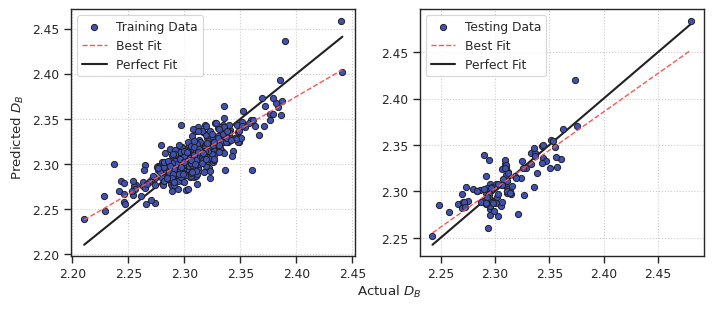

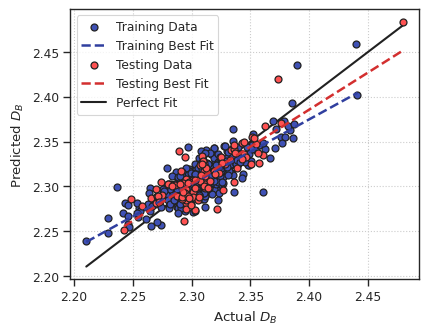

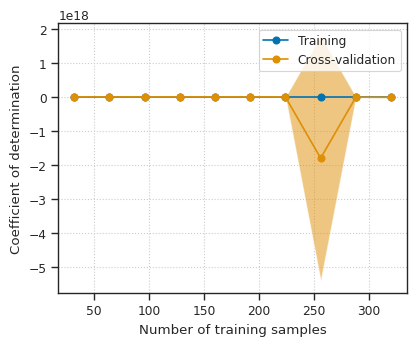

  Feature coefficients:
    time: 0.005
    q6q6_avg_surf: 0.028
    S_110: 0.044
    S_311: 0.033
    R_skew: 0.029
    MM_TCN_avg: 0.245
    MM_BL_avg: 0.019
    HCP: 0.024
    ICOS: 0.016
    DECA: 0.011
    Curve_1-10: 4112612388402.873
    Curve_11-20: 1854739421015.066
    Curve_21-30: 2181472658196.437
    Curve_31-40: 2581355127582.757
    Curve_41-50: 305601236766.652
    Curve_51-60: 104034463580.190
    Curve_61-70: 24383077401.586
    Curve_71-80: 3251076986.858
    MM_SCN_2: 0.001
    MM_SCN_3: 0.001
    MM_SCN_6: 0.005
    MM_SCN_7: 0.234
    MM_SCN_8: 0.337
    MM_SCN_14: 0.013
    q6q6_S_0: 0.115
    q6q6_S_2: 0.002
    q6q6_S_3: 0.036
    q6q6_S_10: 0.103
    q6q6_S_13: 0.013
    MM_TCN_9: 0.726
    MM_TCN_11: 0.001
    MM_TCN_16: 0.010
    q6q6_T_8: 2102140195872.486
    q6q6_T_11: 0.057
    q6q6_T_13: 0.052
    MM_BCN_8: 0.017
    MM_BCN_9: 0.011
    q6q6_B_3: 0.009
    q6q6_B_6: 0.025

Dataset: MNP
Best score: 0.619
Best parameter combination: {'criterion': 'friedma

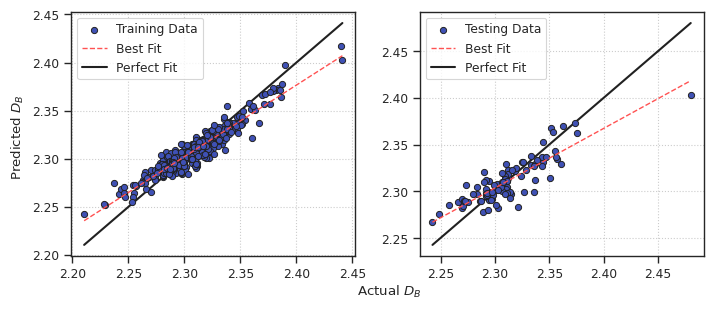

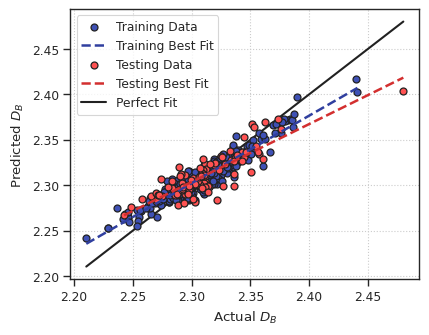

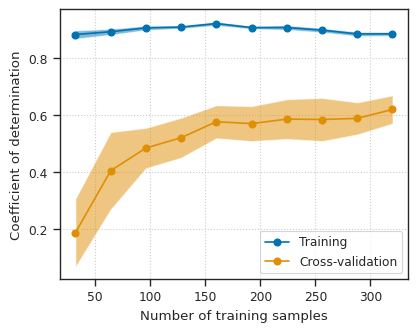

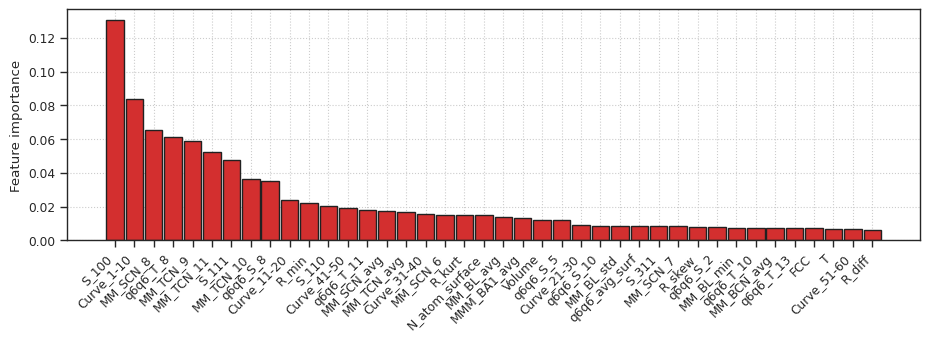

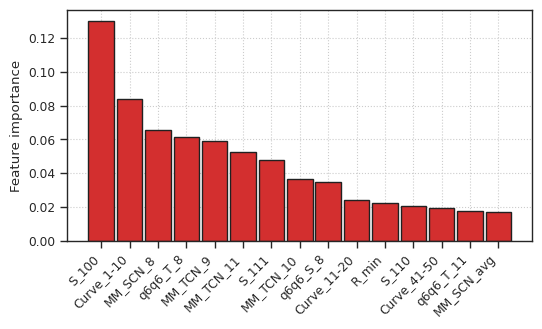

Removing the features with null values...
  Original number of features: 73
  Total number of features left: 73

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.671
    Cross-validation score: -1725257068269877.500 +/- 3450514136539757.000
    Testing score:
      Mean absolute error: 0.014646
      Mean squared error: 0.000361
      Root mean squared error: 0.019009
      Coefficient of determination: 0.680


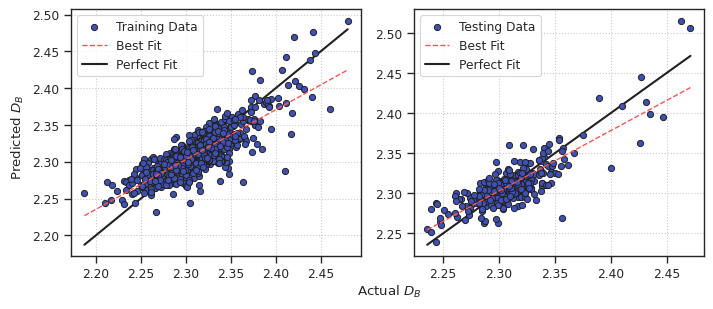

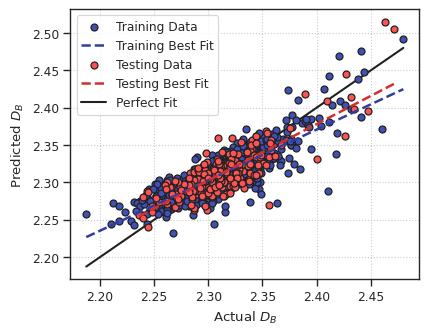

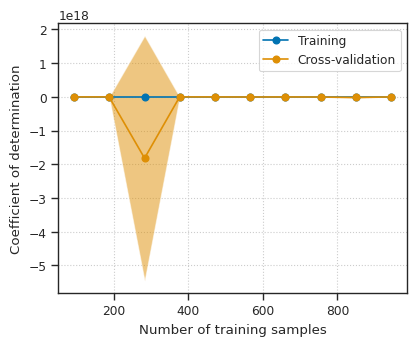

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.048
    S_100: 0.008
    S_111: 0.020
    S_311: 0.194
    R_diff: 0.012
    MM_TCN_avg: 0.294
    MM_BL_avg: 0.006
    MM_BL_min: 0.008
    ICOS: 0.012
    Curve_1-10: 897318373324.704
    Curve_11-20: 400226521324.155
    Curve_21-30: 670923821394.100
    Curve_31-40: 741507860802.265
    Curve_41-50: 76215744679.893
    Curve_51-60: 23653162142.063
    Curve_61-70: 5256258253.802
    Curve_71-80: 1126341054.385
    MM_SCN_1: 0.020
    MM_SCN_8: 0.263
    MM_SCN_9: 0.438
    MM_SCN_13: 0.009
    q6q6_S_8: 0.057
    MM_TCN_16: 0.001
    q6q6_T_8: 0.117
    q6q6_T_10: 1659024565132.784
    q6q6_T_11: 0.009
    q6q6_T_13: 0.058
    q6q6_T_15: 0.022
    MM_BCN_6: 0.015
    MM_BCN_7: 0.013
    MM_BCN_9: 0.031
    q6q6_B_3: 0.004

Dataset: MNP
Best score: 0.697
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.8867536139413233, 'max_leaf_nodes': 45, 'min_samples_leaf': 3, 'min_samples_sp

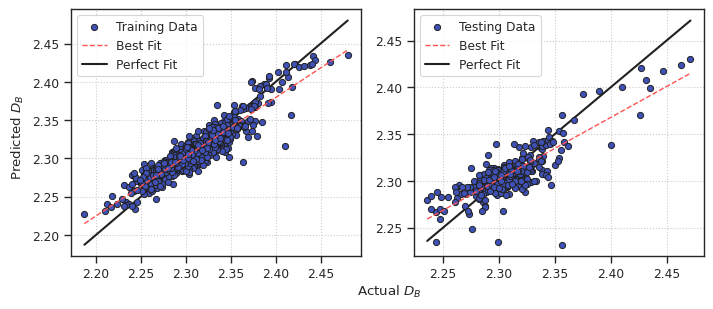

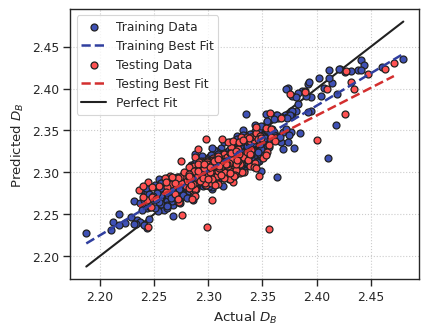

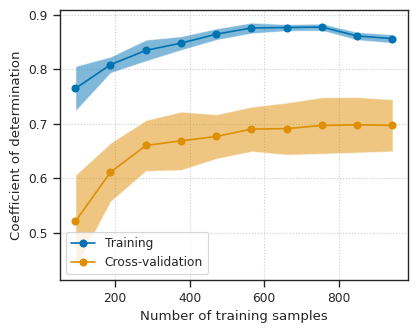

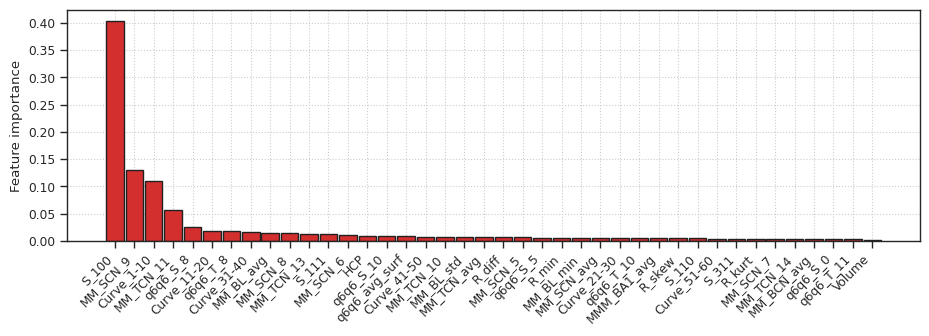

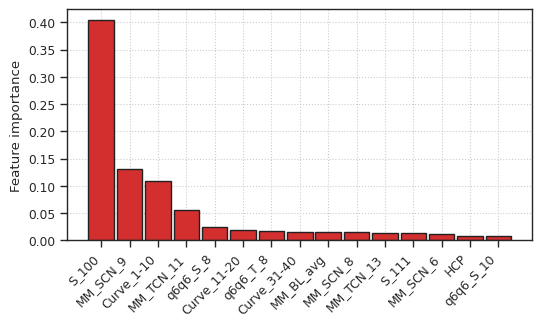

Removing the features with null values...
  Original number of features: 73
  Total number of features left: 73

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.727
    Cross-validation score: 0.702 +/- 0.028
    Testing score:
      Mean absolute error: 0.013920
      Mean squared error: 0.000348
      Root mean squared error: 0.018666
      Coefficient of determination: 0.655


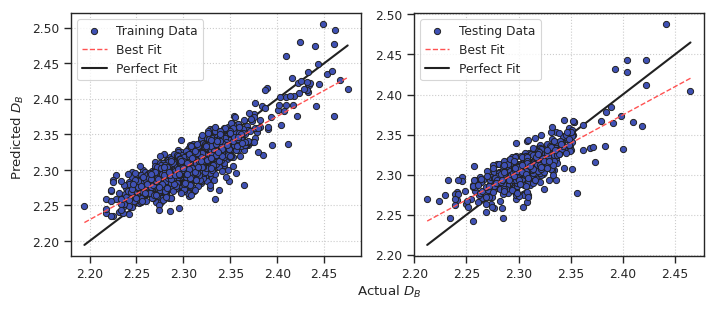

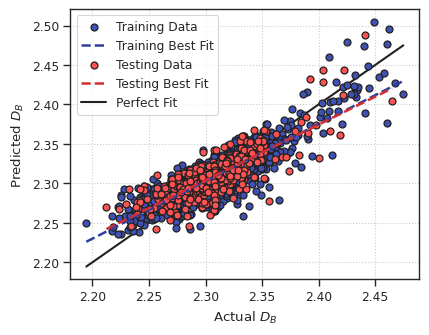

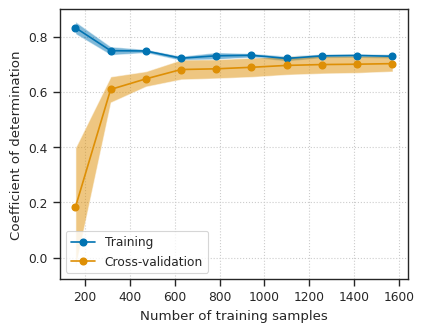

  Feature coefficients:
    time: 0.004
    q6q6_avg_surf: 0.039
    S_100: 0.040
    S_110: 0.085
    S_311: 0.076
    N_atom_surface: 0.103
    R_skew: 0.006
    MM_TCN_avg: 0.332
    MM_BL_avg: 0.011
    FCC: 0.029
    MM_SCN_6: 0.024
    MM_SCN_7: 0.119
    MM_SCN_8: 0.338
    MM_SCN_9: 0.736
    MM_SCN_11: 0.035
    MM_SCN_13: 0.004
    q6q6_S_0: 0.029
    q6q6_S_8: 0.144
    MM_TCN_10: 0.043
    MM_TCN_14: 0.008
    MM_TCN_16: 0.005
    q6q6_T_8: 0.049
    q6q6_T_11: 0.057
    q6q6_T_13: 0.031
    q6q6_T_14: 0.026
    MM_BCN_5: 0.005
    MM_BCN_6: 0.007
    MM_BCN_7: 0.010
    MM_BCN_9: 0.027
    q6q6_B_3: 0.024
    q6q6_B_4: 0.005

Dataset: MNP
Best score: 0.746
Best parameter combination: {'criterion': 'poisson', 'max_depth': 9, 'max_features': 0.47682562899491576, 'max_leaf_nodes': 61, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 88}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.858
    Cross-validation score: 0

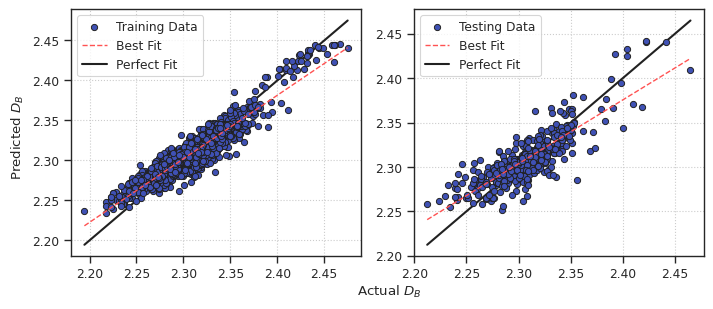

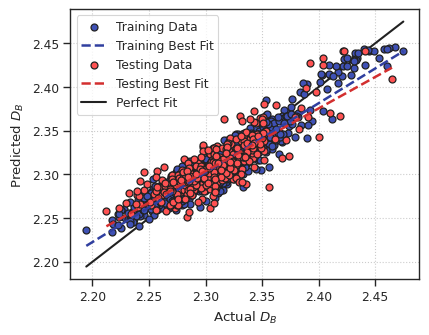

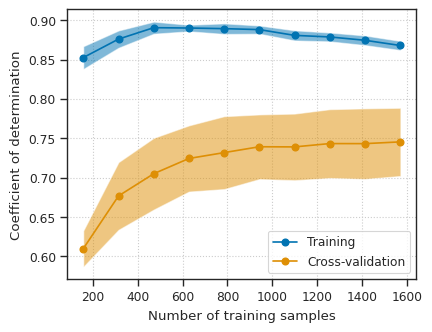

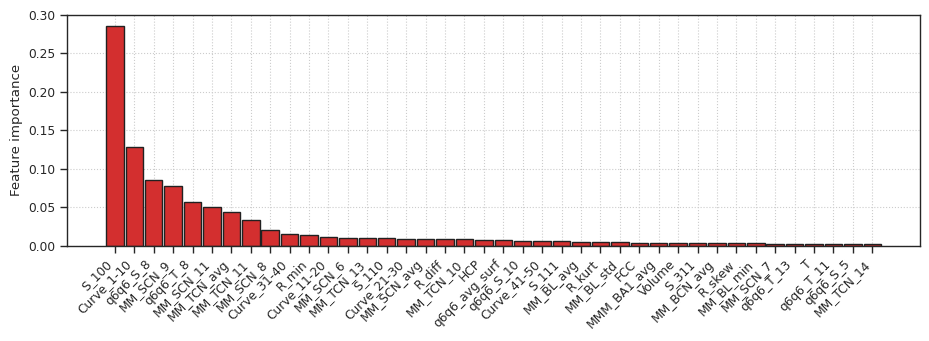

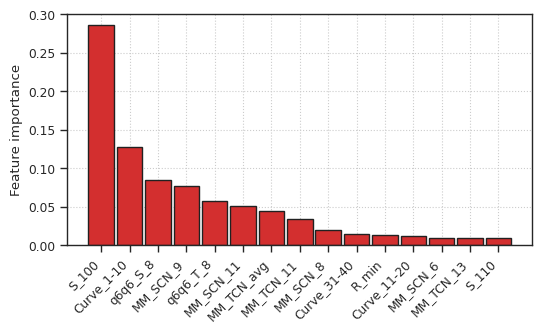

Removing the features with null values...
  Original number of features: 72
  Total number of features left: 72

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.697
    Cross-validation score: 0.670 +/- 0.048
    Testing score:
      Mean absolute error: 0.013440
      Mean squared error: 0.000324
      Root mean squared error: 0.017995
      Coefficient of determination: 0.674


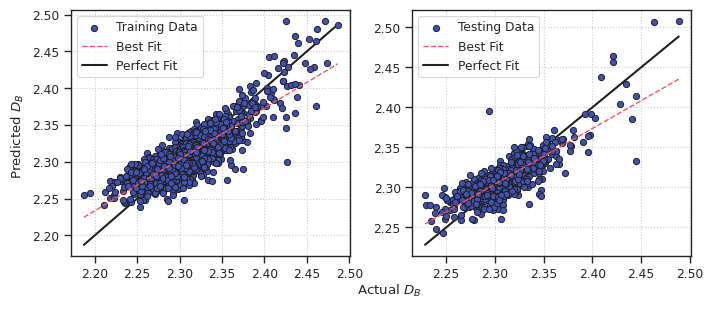

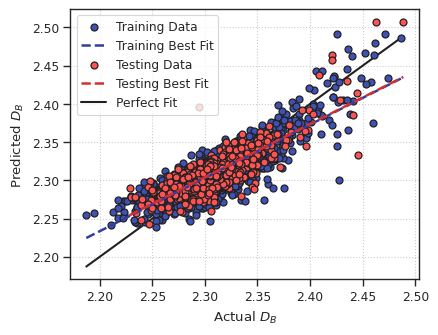

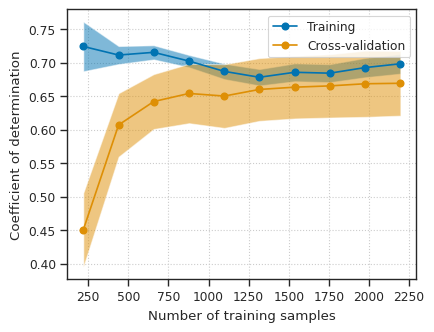

  Feature coefficients:
    T: 0.001
    time: 0.005
    q6q6_avg_surf: 0.036
    S_100: 0.067
    S_110: 0.145
    S_311: 0.137
    MM_TCN_avg: 0.306
    MM_BL_avg: 0.014
    FCC: 0.025
    HCP: 0.013
    Curve_61-70: 0.001
    Curve_71-80: 0.003
    MM_SCN_2: 0.001
    MM_SCN_6: 0.041
    MM_SCN_7: 0.124
    MM_SCN_8: 0.311
    MM_SCN_9: 0.719
    MM_SCN_13: 0.006
    MM_SCN_14: 0.004
    q6q6_S_3: 0.001
    q6q6_S_8: 0.067
    MM_TCN_10: 0.025
    MM_TCN_14: 0.014
    MM_TCN_16: 0.010
    MM_TCN_17: 0.018
    q6q6_T_8: 0.117
    q6q6_T_11: 0.023
    q6q6_T_13: 0.068
    MM_BCN_9: 0.047
    q6q6_B_3: 0.005
    q6q6_B_4: 0.009

Dataset: MNP
Best score: 0.721
Best parameter combination: {'criterion': 'poisson', 'max_depth': 9, 'max_features': 0.6229135840375986, 'max_leaf_nodes': 77, 'min_samples_leaf': 5, 'min_samples_split': 17, 'n_estimators': 47}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.829
    Cross-validation score: 0.721 +/- 0.

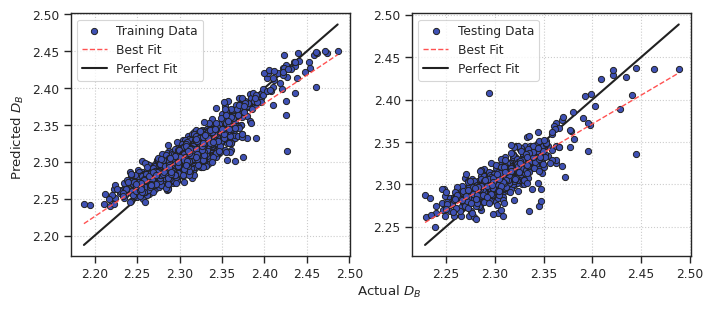

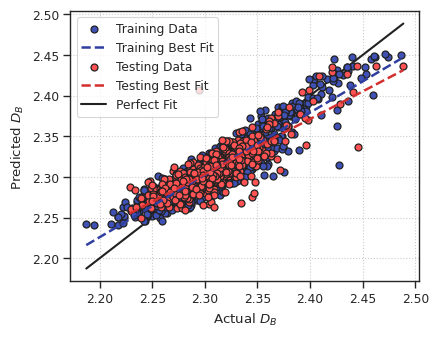

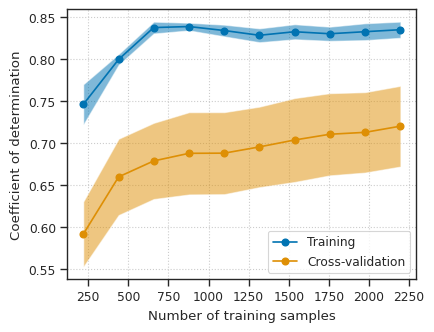

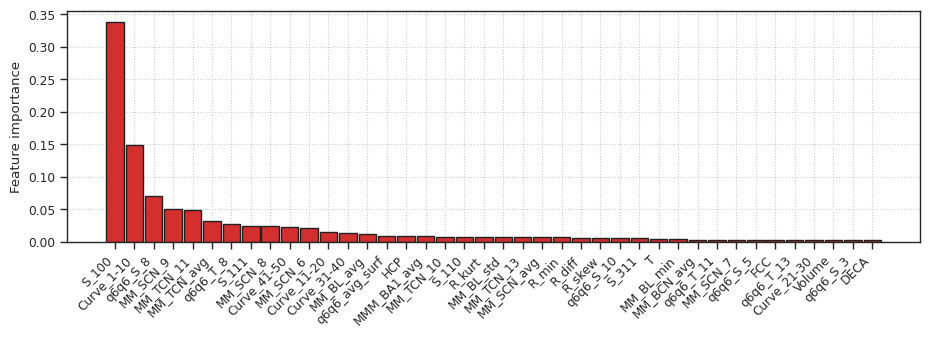

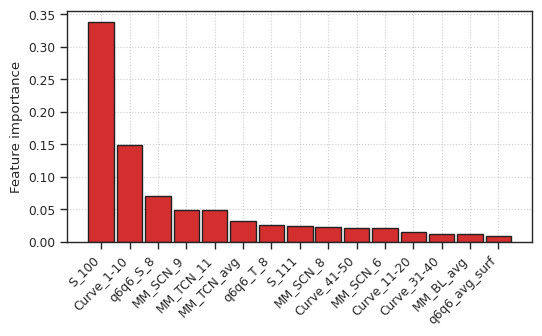

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.693
    Cross-validation score: -8718813583840029696.000 +/- 17437627167680061440.000
    Testing score:
      Mean absolute error: 0.013229
      Mean squared error: 0.000320
      Root mean squared error: 0.017885
      Coefficient of determination: 0.675


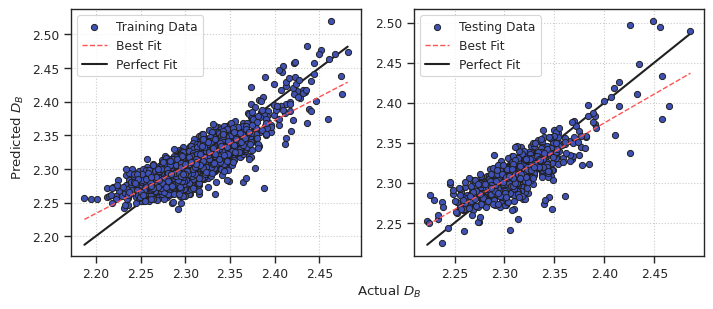

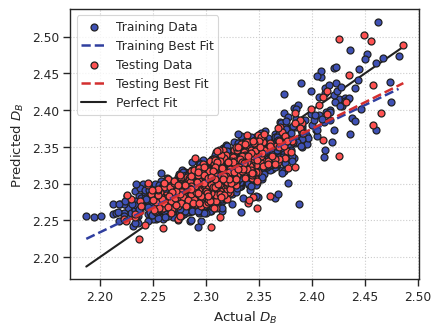

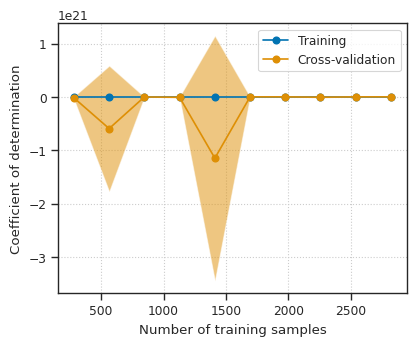

  Feature coefficients:
    time: 0.005
    q6q6_avg_surf: 0.045
    S_100: 0.073
    S_110: 0.178
    S_311: 0.112
    N_atom_surface: 0.703
    R_diff: 0.002
    R_skew: 0.004
    MM_TCN_avg: 0.271
    MM_BL_avg: 0.006
    FCC: 0.019
    MM_SCN_13: 0.003
    q6q6_S_10: 282474510591.627
    MM_TCN_11: 0.033
    MM_TCN_16: 0.003
    MM_TCN_17: 0.022
    q6q6_T_8: 0.098
    q6q6_T_13: 0.036
    q6q6_T_14: 0.014
    MM_BCN_7: 0.011
    MM_BCN_8: 0.003
    MM_BCN_9: 0.088
    q6q6_B_3: 0.018
    q6q6_B_10: 211211944089.925

Dataset: MNP
Best score: 0.734
Best parameter combination: {'criterion': 'poisson', 'max_depth': 9, 'max_features': 0.6229135840375986, 'max_leaf_nodes': 77, 'min_samples_leaf': 5, 'min_samples_split': 17, 'n_estimators': 47}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.823
    Cross-validation score: 0.734 +/- 0.017
    Testing score:
      Mean absolute error: 0.011860
      Mean squared error: 0.000266
      Root mean 

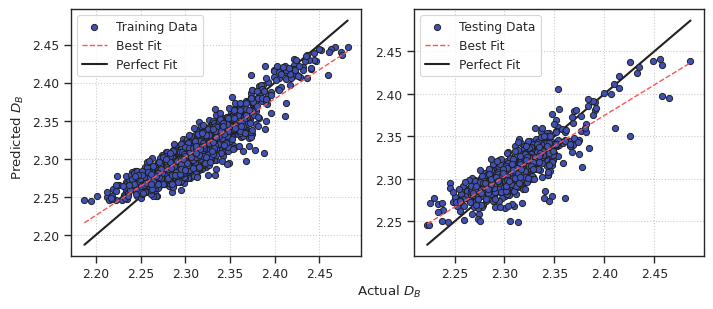

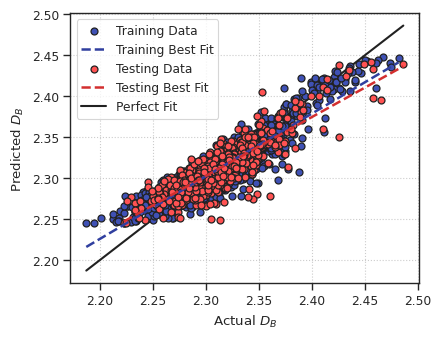

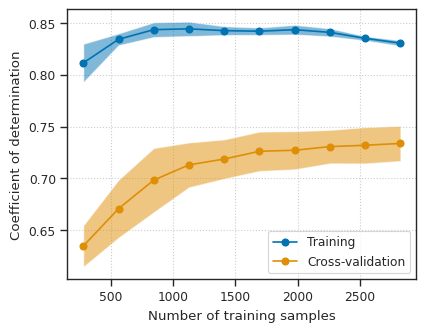

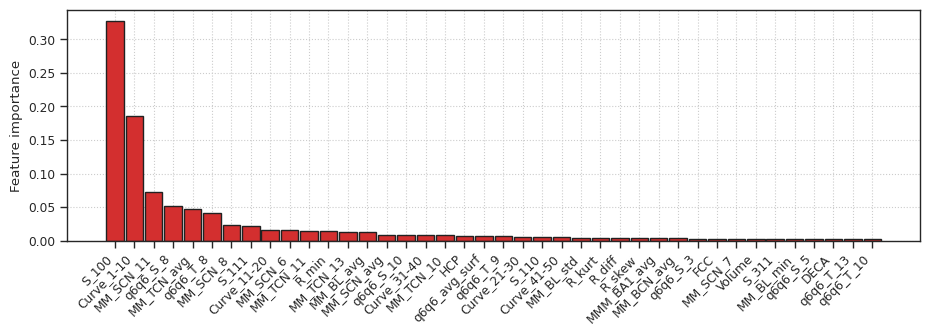

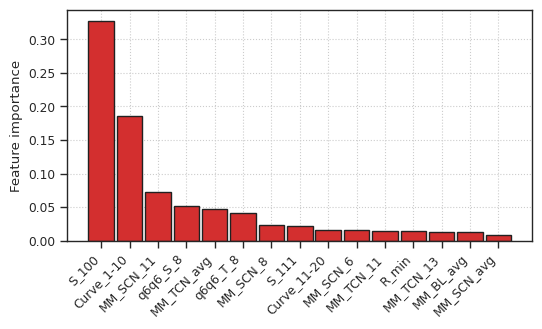

Removing the features with null values...
  Original number of features: 73
  Total number of features left: 73

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.697
    Cross-validation score: 0.684 +/- 0.026
    Testing score:
      Mean absolute error: 0.013553
      Mean squared error: 0.000329
      Root mean squared error: 0.018140
      Coefficient of determination: 0.678


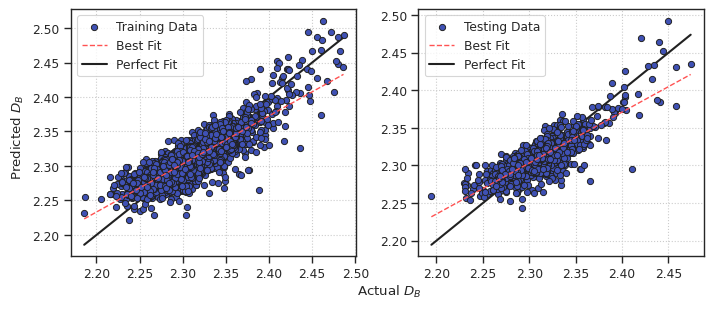

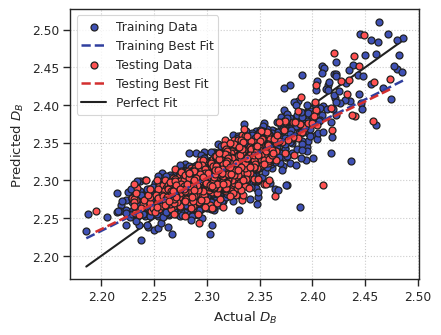

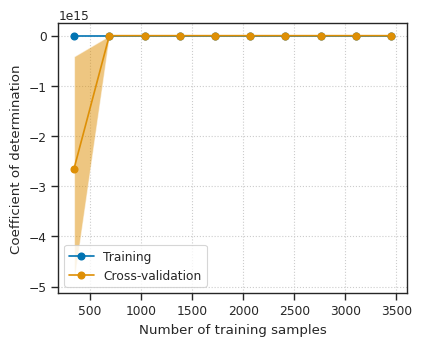

  Feature coefficients:
    time: 0.003
    q6q6_avg_surf: 0.041
    S_100: 0.045
    S_110: 0.130
    S_311: 0.151
    R_diff: 0.002
    R_skew: 0.004
    MM_TCN_avg: 0.341
    MM_BL_avg: 0.015
    FCC: 0.022
    ICOS: 0.001
    Curve_11-20: 0.076
    Curve_31-40: 0.028
    Curve_51-60: 0.012
    MM_SCN_6: 0.045
    MM_SCN_7: 0.133
    MM_SCN_8: 0.338
    MM_SCN_9: 0.758
    MM_SCN_12: 0.003
    MM_SCN_13: 0.004
    q6q6_S_0: 0.018
    q6q6_S_8: 0.155
    q6q6_S_13: 0.003
    MM_TCN_10: 0.002
    MM_TCN_16: 0.003
    q6q6_T_8: 0.072
    q6q6_T_10: 0.002
    q6q6_T_11: 0.016
    q6q6_T_13: 0.026
    q6q6_T_14: 0.027
    MM_BCN_7: 0.009
    MM_BCN_9: 0.031
    q6q6_B_3: 0.019

Dataset: MNP
Best score: 0.728
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 8, 'max_features': 0.5855421631378035, 'max_leaf_nodes': 97, 'min_samples_leaf': 6, 'min_samples_split': 14, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training 

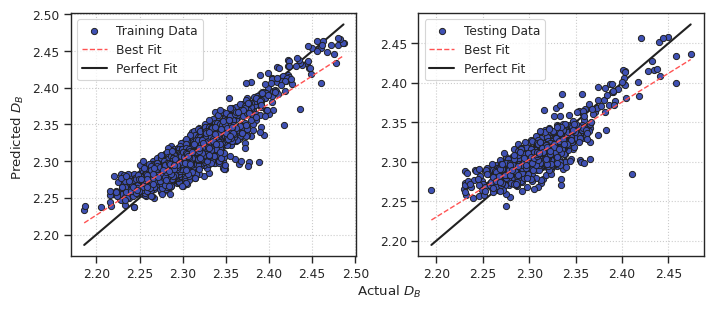

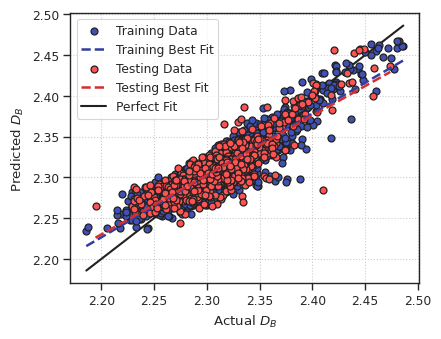

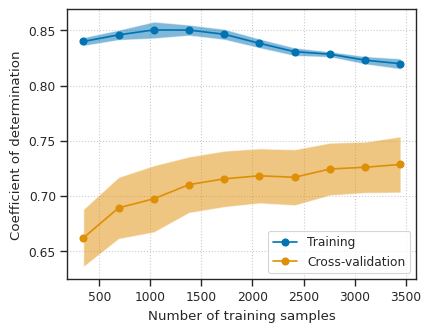

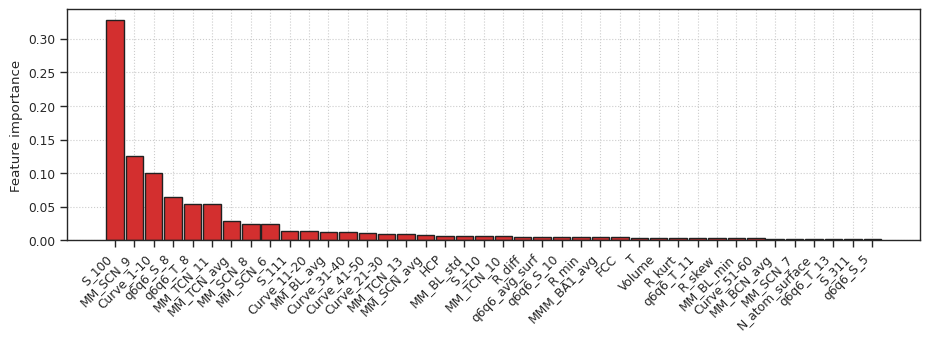

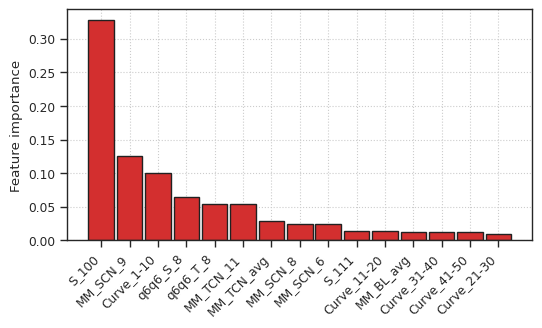

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.680
    Cross-validation score: 0.663 +/- 0.036
    Testing score:
      Mean absolute error: 0.012856
      Mean squared error: 0.000286
      Root mean squared error: 0.016920
      Coefficient of determination: 0.705


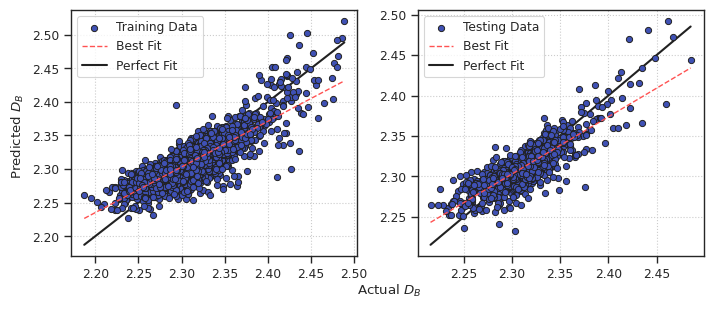

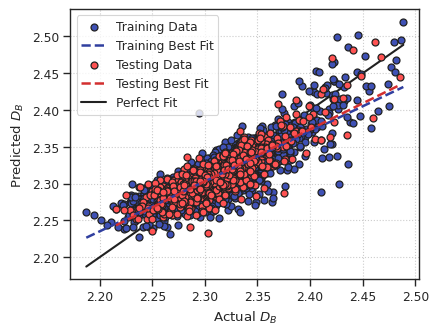

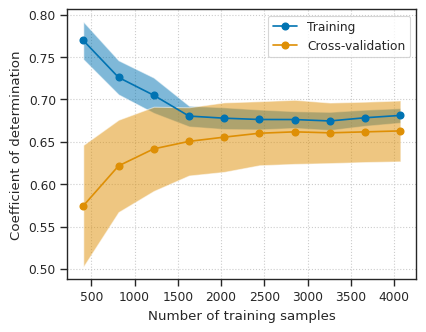

  Feature coefficients:
    time: 0.003
    q6q6_avg_surf: 0.051
    S_110: 0.097
    S_311: 0.173
    N_atom_surface: 0.791
    R_diff: 0.004
    MM_TCN_avg: 0.298
    MM_BL_avg: 0.008
    MM_BL_min: 0.002
    FCC: 0.028
    ICOS: 0.005
    Curve_71-80: 0.003
    MM_SCN_2: 0.001
    MM_SCN_13: 0.007
    MM_SCN_15: 0.006
    q6q6_S_8: 0.086
    MM_TCN_11: 0.003
    MM_TCN_16: 0.001
    MM_TCN_17: 0.023
    q6q6_T_8: 0.054
    q6q6_T_9: 0.050
    q6q6_T_13: 0.059
    q6q6_T_14: 0.014
    MM_BCN_5: 0.003
    MM_BCN_7: 0.006
    MM_BCN_9: 0.107
    q6q6_B_3: 0.022
    q6q6_B_10: 0.028

Dataset: MNP
Best score: 0.719
Best parameter combination: {'criterion': 'poisson', 'max_depth': 8, 'max_features': 0.8895355865435616, 'max_leaf_nodes': 90, 'min_samples_leaf': 9, 'min_samples_split': 17, 'n_estimators': 95}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.798
    Cross-validation score: 0.719 +/- 0.035
    Testing score:
      Mean absolute erro

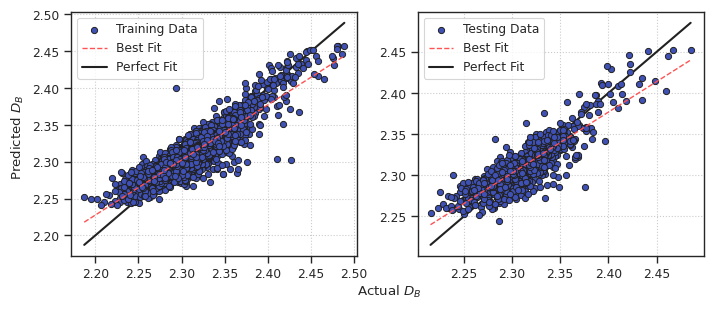

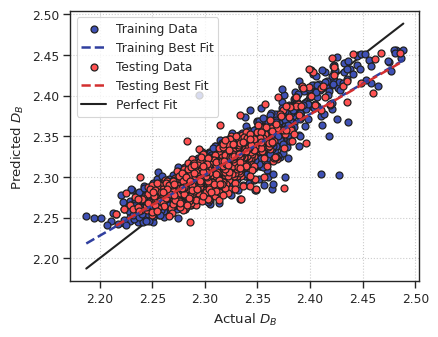

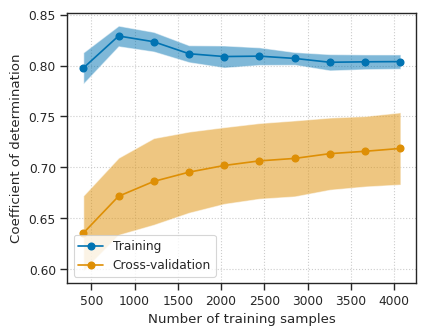

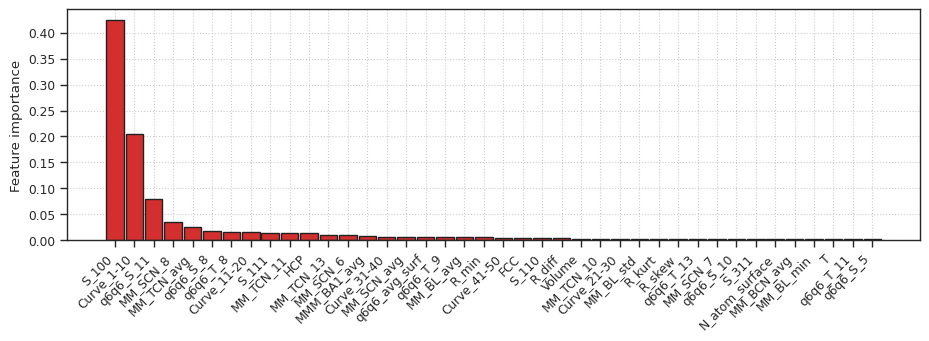

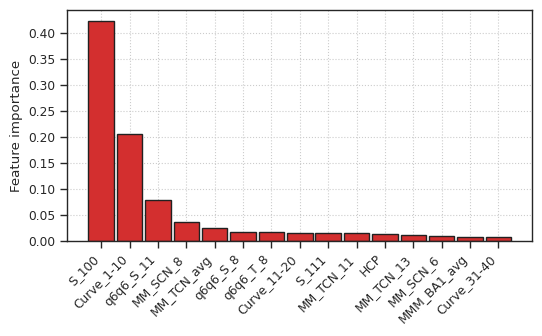

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.689
    Cross-validation score: 0.679 +/- 0.018
    Testing score:
      Mean absolute error: 0.013574
      Mean squared error: 0.000326
      Root mean squared error: 0.018067
      Coefficient of determination: 0.628


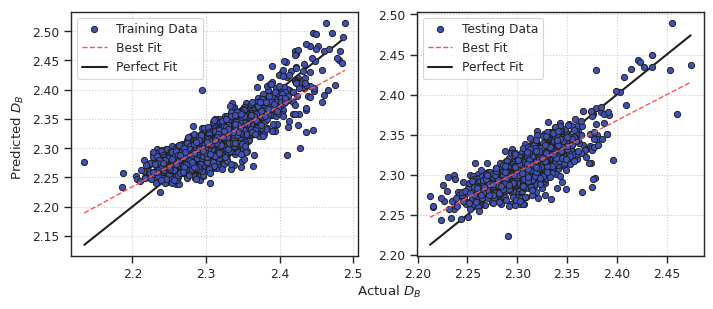

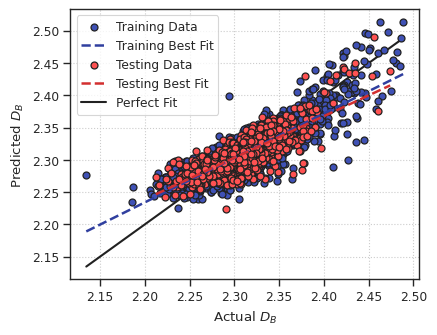

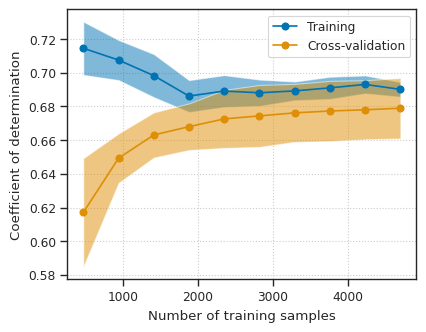

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.045
    S_110: 0.118
    S_311: 0.135
    N_atom_surface: 1.179
    R_diff: 0.007
    MM_TCN_avg: 0.307
    MM_BL_avg: 0.010
    FCC: 0.017
    Curve_71-80: 0.003
    MM_SCN_13: 0.001
    MM_SCN_15: 0.009
    q6q6_S_8: 0.105
    MM_TCN_11: 0.027
    MM_TCN_16: 0.003
    MM_TCN_17: 0.020
    q6q6_T_8: 0.060
    q6q6_T_10: 0.023
    q6q6_T_13: 0.040
    q6q6_T_14: 0.026
    MM_BCN_7: 0.008
    MM_BCN_8: 0.005
    MM_BCN_9: 0.100
    q6q6_B_3: 0.021

Dataset: MNP
Best score: 0.734
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 8, 'max_features': 0.5855421631378035, 'max_leaf_nodes': 97, 'min_samples_leaf': 6, 'min_samples_split': 14, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.803
    Cross-validation score: 0.734 +/- 0.027
    Testing score:
      Mean absolute error: 0.011893
      Mean squared error: 0.000270
      Root mean squared e

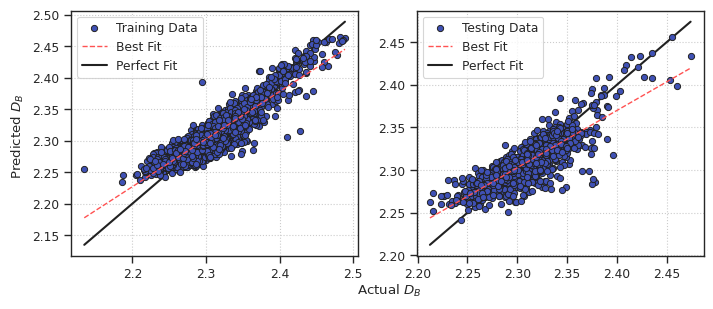

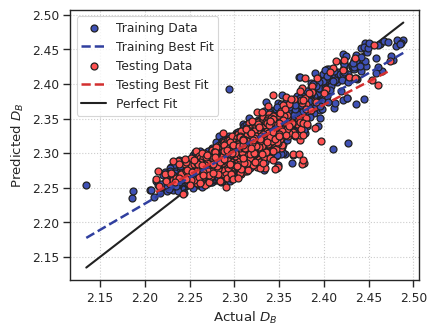

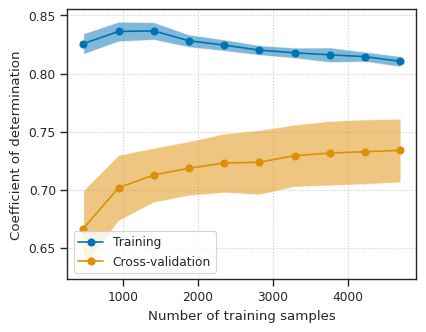

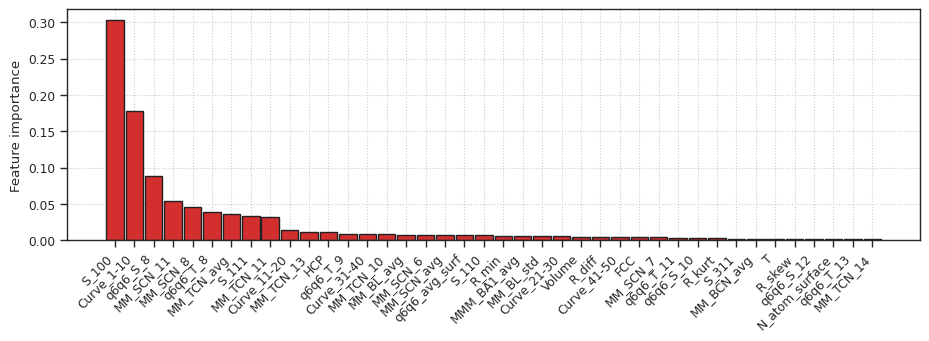

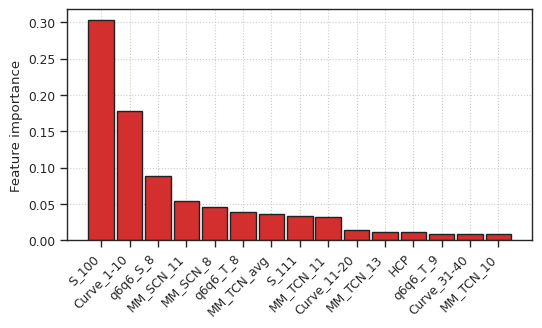

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.688
    Cross-validation score: 0.680 +/- 0.023
    Testing score:
      Mean absolute error: 0.012720
      Mean squared error: 0.000295
      Root mean squared error: 0.017171
      Coefficient of determination: 0.682


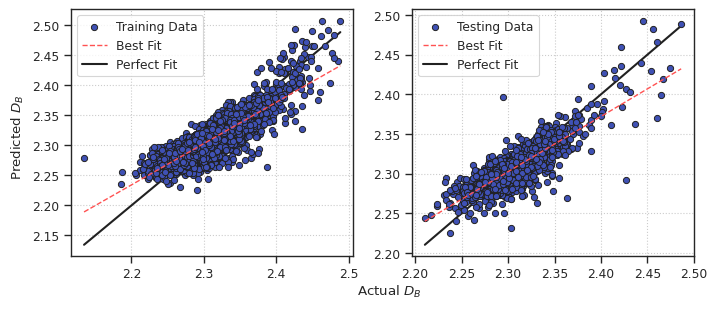

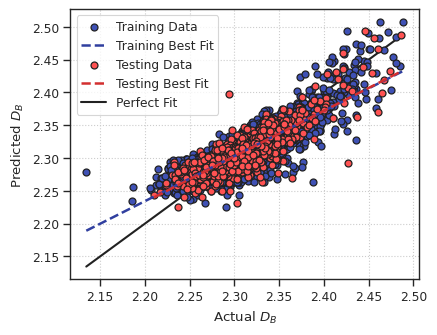

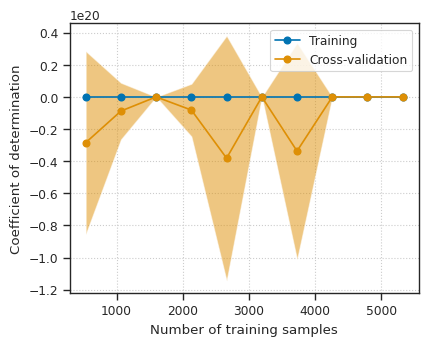

  Feature coefficients:
    time: 0.004
    q6q6_avg_surf: 0.040
    S_110: 0.088
    S_311: 0.133
    R_diff: 0.009
    MM_TCN_avg: 0.310
    MM_BL_avg: 0.012
    FCC: 0.020
    HCP: 0.002
    MM_SCN_6: 0.078
    MM_SCN_7: 0.179
    MM_SCN_8: 0.402
    MM_SCN_11: 0.105
    MM_SCN_12: 0.004
    MM_SCN_13: 0.004
    MM_SCN_15: 0.008
    q6q6_S_0: 0.011
    q6q6_S_8: 0.175
    MM_TCN_9: 0.790
    MM_TCN_10: 0.036
    MM_TCN_14: 0.005
    MM_TCN_16: 0.006
    MM_TCN_17: 0.018
    q6q6_T_8: 0.065
    q6q6_T_11: 0.017
    q6q6_T_13: 0.070
    MM_BCN_7: 0.006
    q6q6_B_3: 0.018
    q6q6_B_10: 0.020

Dataset: MNP
Best score: 0.733
Best parameter combination: {'criterion': 'friedman_mse', 'max_depth': 9, 'max_features': 0.3935984562828384, 'max_leaf_nodes': 82, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 47}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.795
    Cross-validation score: 0.733 +/- 0.023
    Testing score:
      M

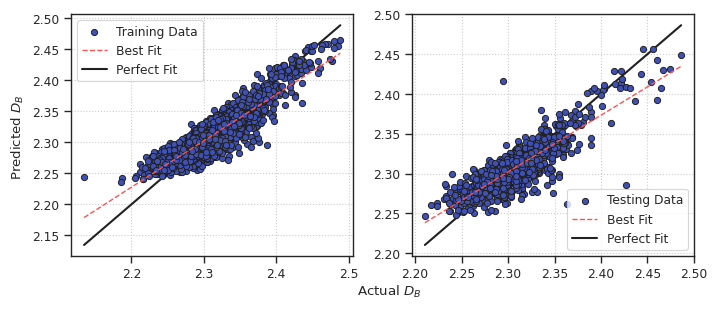

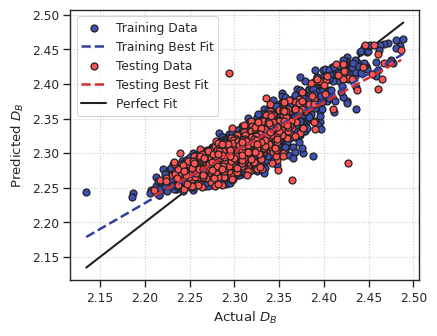

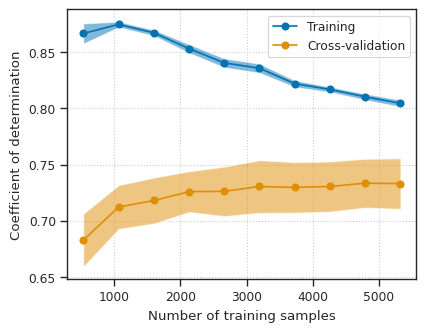

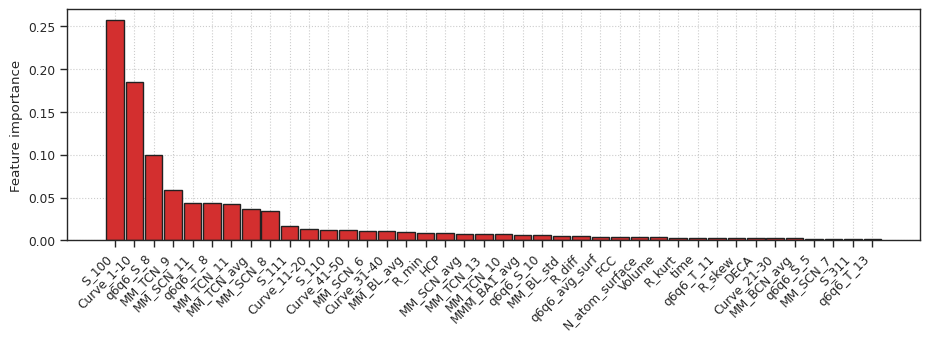

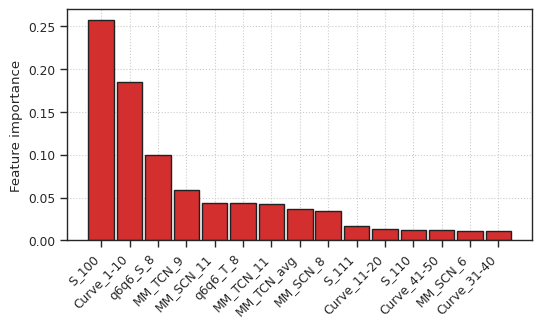

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.678
    Cross-validation score: 0.670 +/- 0.021
    Testing score:
      Mean absolute error: 0.013247
      Mean squared error: 0.000313
      Root mean squared error: 0.017705
      Coefficient of determination: 0.679


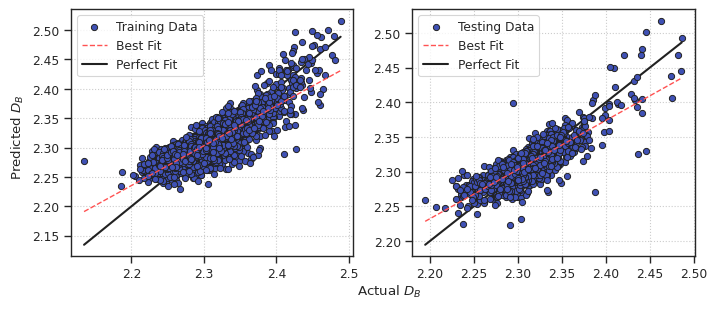

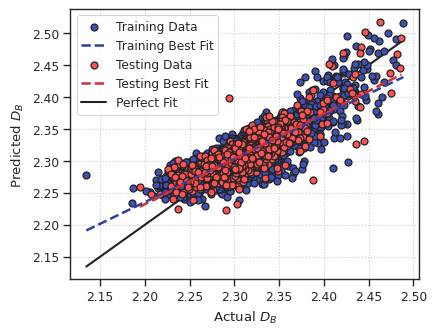

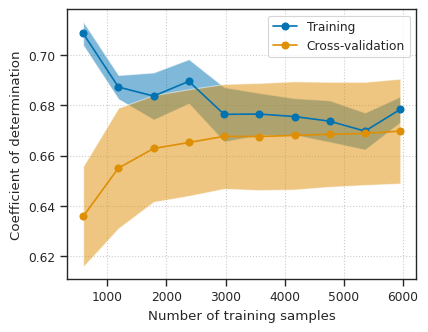

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.047
    S_100: 0.010
    S_110: 0.133
    S_311: 0.154
    N_atom_surface: 0.808
    R_diff: 0.011
    MM_TCN_avg: 0.319
    MM_BL_avg: 0.012
    FCC: 0.026
    HCP: 0.001
    ICOS: 0.001
    Curve_71-80: 0.001
    MM_SCN_13: 0.004
    q6q6_S_8: 0.082
    MM_TCN_11: 0.023
    MM_TCN_16: 0.007
    MM_TCN_17: 0.020
    q6q6_T_8: 0.065
    q6q6_T_9: 0.002
    q6q6_T_13: 0.037
    q6q6_T_14: 0.015
    MM_BCN_5: 0.003
    MM_BCN_7: 0.007
    MM_BCN_8: 0.002
    MM_BCN_9: 0.105
    q6q6_B_3: 0.026
    q6q6_B_10: 0.020

Dataset: MNP


In [ ]:
for (i, numSamples) in enumerate(NUM_SAMPLES _ 250):
    FIG_NAME_APPENDIX = f"_Etot_minmax_random_{i}"

    train = MNPDF.sample(n=numSamples, random_state=RANDOM_STATE + i)
    test = MNPDF.loc[~train.index]
    XtrainMNP, yTrainMNP = train.iloc[:, :-1], train.iloc[:, -1]
    XtestMNP, yTestMNP = test.iloc[:, :-1], test.iloc[:, -1]
    scaler = MinMaxScaler() 
    Xtrain = scaler.fit_transform(Xtrain)
    Xtrain = pd.DataFrame(Xtrain, columns=X.columns)
    Xtest = scaler.transform(Xtest)
    Xtest = pd.DataFrame(Xtest, columns=X.columns)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

### Extra Instances

Removing the features with null values...
  Original number of features: 77
  Total number of features left: 77

Removing the features with null values...
  Original number of features: 77
  Total number of features left: 77

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.531
    Cross-validation score: 0.223 +/- 0.210
    Testing score:
      Mean absolute error: 0.015850
      Mean squared error: 0.000528
      Root mean squared error: 0.022974
      Coefficient of determination: 0.344


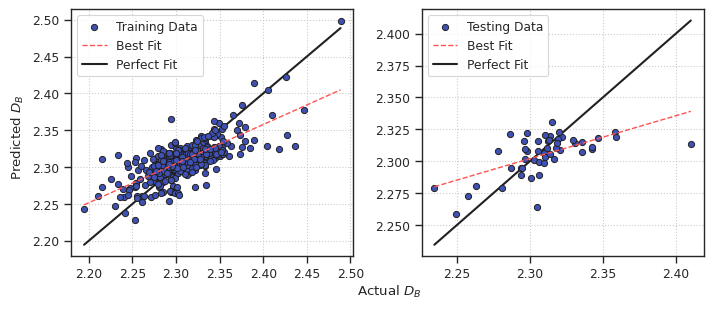

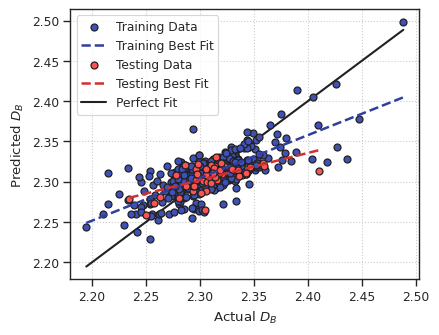

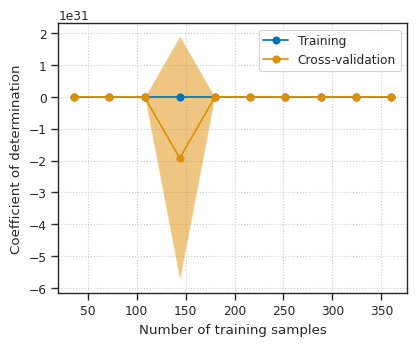

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.004
    R_skew: 0.029
    MM_TCN_avg: 0.065
    MM_BL_avg: 0.010
    MM_BL_min: 0.007
    Curve_61-70: 0.001
    MM_SCN_3: 0.001
    MM_SCN_15: 0.019
    q6q6_S_8: 0.059
    MM_TCN_16: 0.003
    MM_TCN_17: 0.016
    MM_BCN_5: 0.004
    MM_BCN_9: 0.001
    q6q6_B_8: 0.059

Dataset: MNP
Best score: 0.500
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.826
    Cross-validation score: 0.500 +/- 0.052
    Testing score:
      Mean absolute error: 0.014348
      Mean squared error: 0.000624
      Root mean squared error: 0.024978
      Coefficient of determination: 0.225


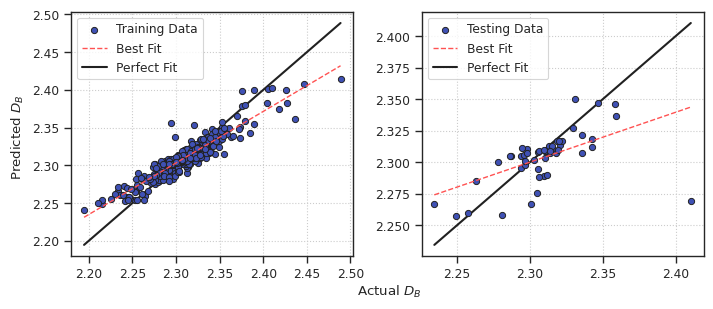

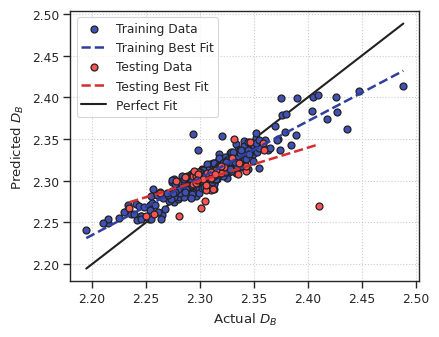

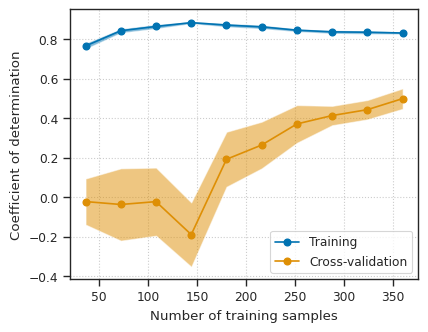

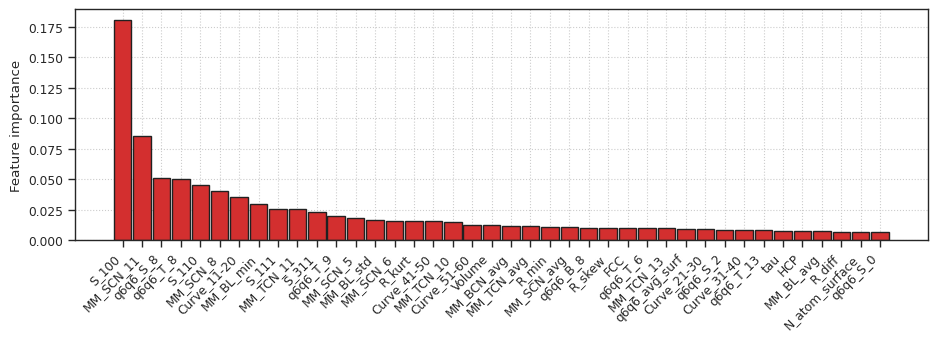

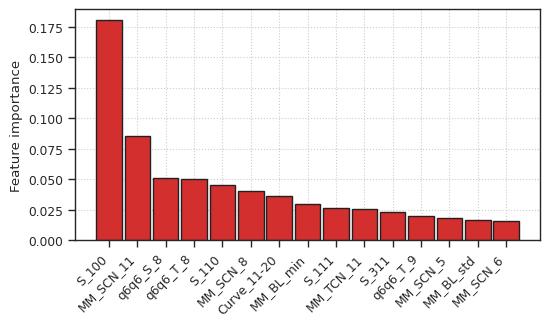

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.406
    Cross-validation score: 0.290 +/- 0.078
    Testing score:
      Mean absolute error: 0.019855
      Mean squared error: 0.000673
      Root mean squared error: 0.025943
      Coefficient of determination: 0.295


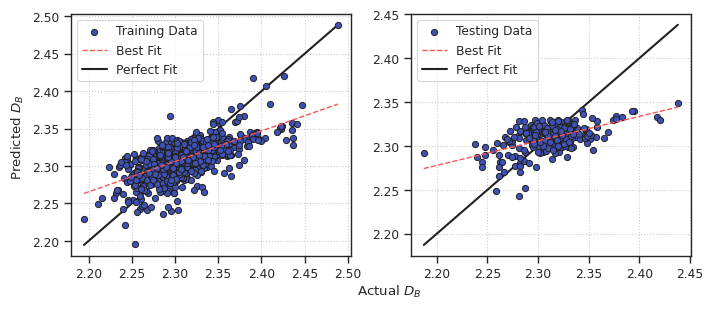

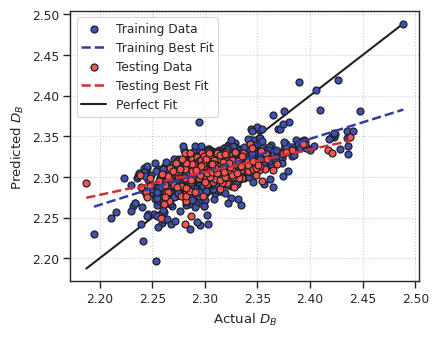

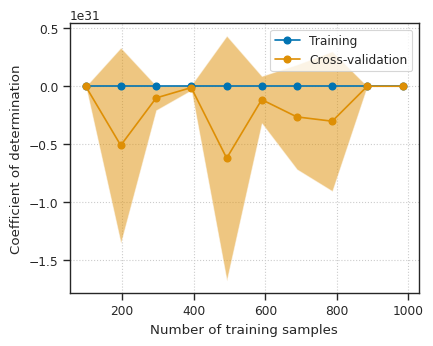

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.005
    R_diff: 0.008
    MM_TCN_avg: 0.111
    MM_BCN_avg: 0.006
    MM_BL_avg: 0.008
    MM_BL_min: 0.007
    Curve_51-60: 0.001
    Curve_61-70: 0.001
    MM_SCN_3: 0.001
    MM_SCN_14: 0.003
    MM_SCN_15: 0.015
    MM_TCN_16: 0.004
    MM_TCN_17: 0.003
    q6q6_T_8: 0.068

Dataset: MNP
Best score: 0.633
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9257887086883703, 'max_leaf_nodes': 75, 'min_samples_leaf': 6, 'min_samples_split': 3, 'n_estimators': 43}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.834
    Cross-validation score: 0.633 +/- 0.026
    Testing score:
      Mean absolute error: 0.013056
      Mean squared error: 0.000338
      Root mean squared error: 0.018375
      Coefficient of determination: 0.646


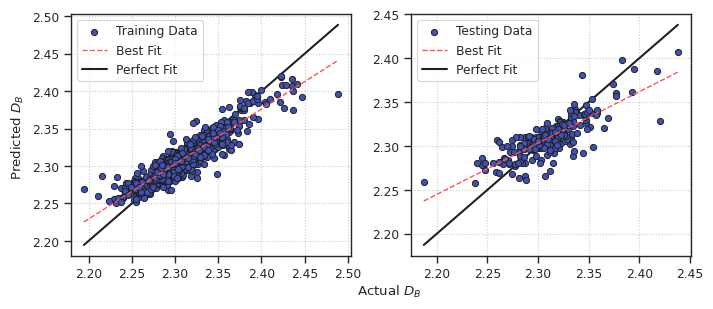

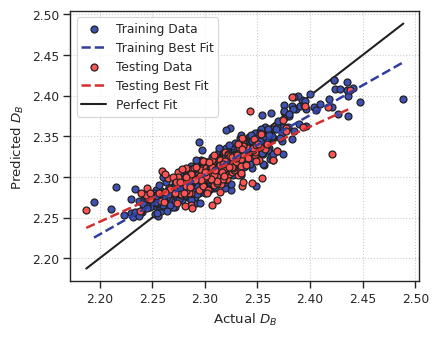

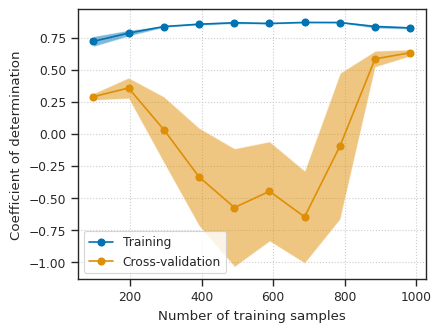

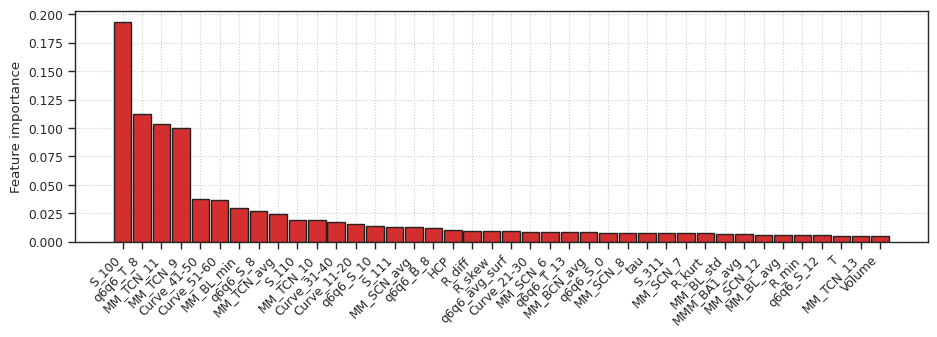

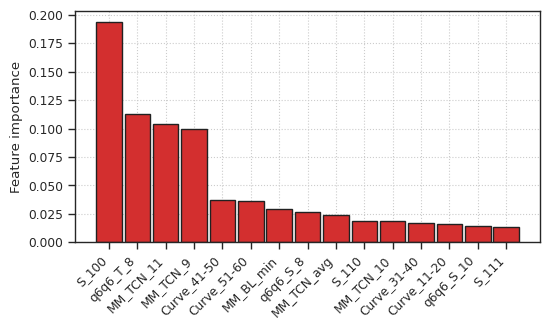

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.446
    Cross-validation score: 0.366 +/- 0.056
    Testing score:
      Mean absolute error: 0.017734
      Mean squared error: 0.000604
      Root mean squared error: 0.024570
      Coefficient of determination: 0.431


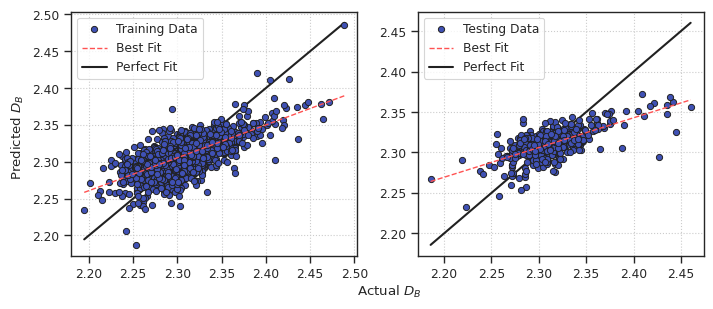

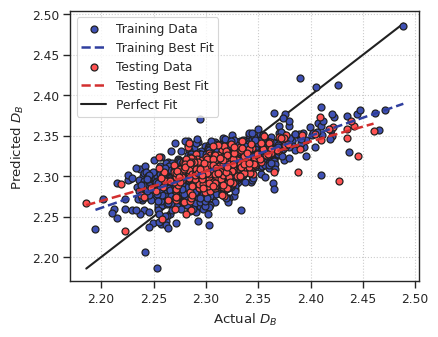

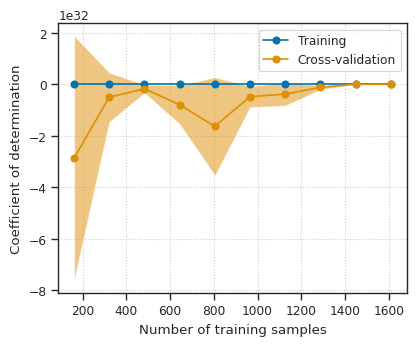

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.004
    N_atom_surface: 0.022
    R_diff: 0.038
    R_min: 0.015
    MM_TCN_avg: 0.111
    MM_BCN_avg: 0.001
    MM_BL_avg: 0.005
    MM_BL_std: 0.002
    MM_BL_min: 0.004
    ICOS: 0.002
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_15: 0.005
    MM_TCN_16: 0.007
    MM_TCN_17: 0.010
    q6q6_T_10: 0.091
    MM_BCN_5: 0.001
    MM_BCN_6: 0.001
    MM_BCN_7: 0.002
    MM_BCN_8: 0.001
    MM_BCN_9: 0.001

Dataset: MNP
Best score: 0.631
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.824
    Cross-validation score: 0.631 +/- 0.029
    Testing score:
      Mean absolute error: 0.012523
      Mean squared error: 0.000363
      Root mean squared error: 0.019056
      Coefficient of 

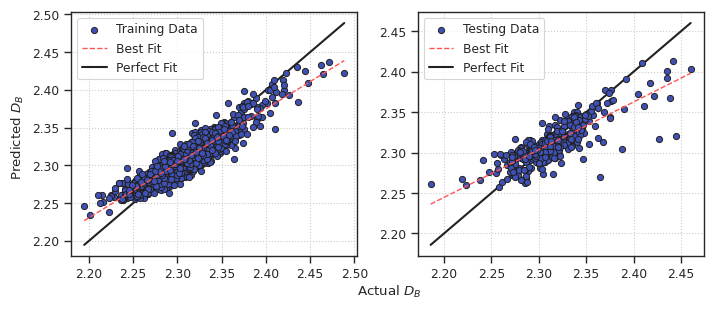

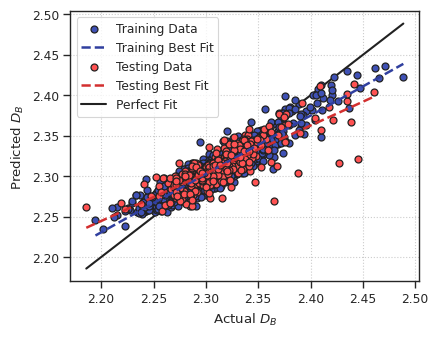

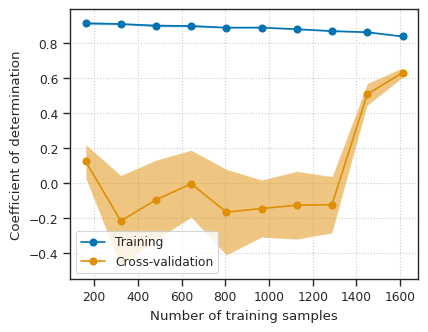

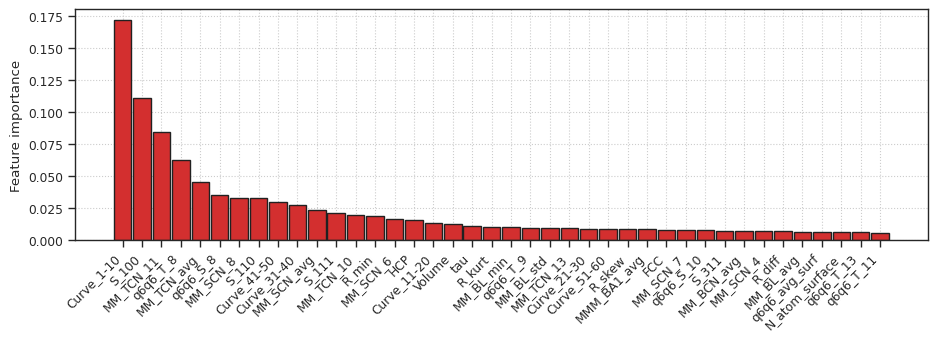

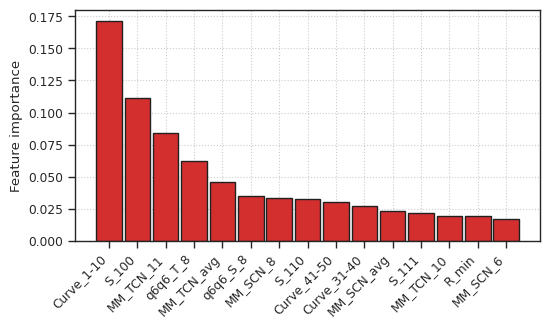

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.449
    Cross-validation score: 0.348 +/- 0.075
    Testing score:
      Mean absolute error: 0.017224
      Mean squared error: 0.000534
      Root mean squared error: 0.023108
      Coefficient of determination: 0.461


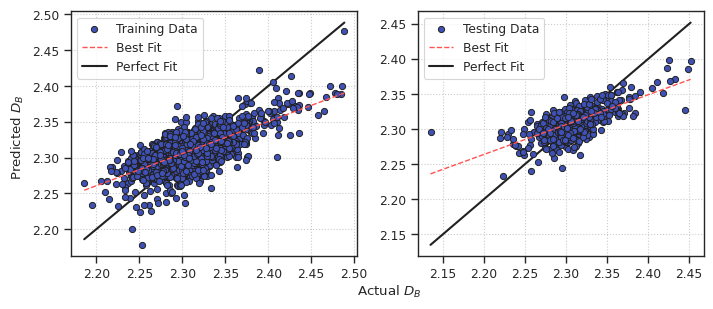

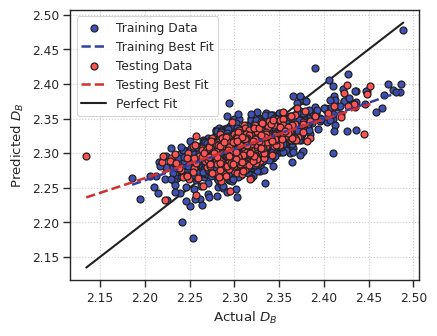

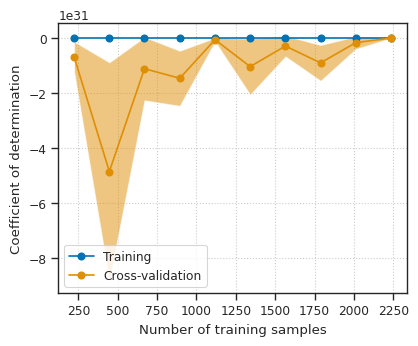

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.003
    N_atom_surface: 0.029
    R_diff: 0.057
    R_min: 0.050
    MM_TCN_avg: 0.118
    MM_BCN_avg: 0.013
    MM_BL_avg: 0.003
    MM_BL_std: 0.006
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.004
    MM_SCN_15: 0.005
    q6q6_S_8: 0.149
    MM_TCN_16: 0.005
    MM_TCN_17: 0.001
    q6q6_T_10: 0.486
    MM_BCN_6: 0.005
    MM_BCN_7: 0.002
    MM_BCN_8: 0.001
    MM_BCN_9: 0.001
    q6q6_B_8: 0.149

Dataset: MNP
Best score: 0.660
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.38547614508885875, 'max_leaf_nodes': 79, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 91}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.813
    Cross-validation score: 0.660 +/- 0.036
    Testing score:
      Mean absolute error: 0.011955
      Mean squared error: 0.000280
      Root mean squared error: 0.016732
      Coefficient

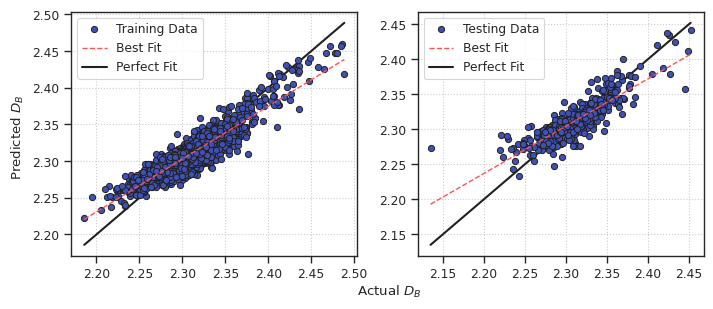

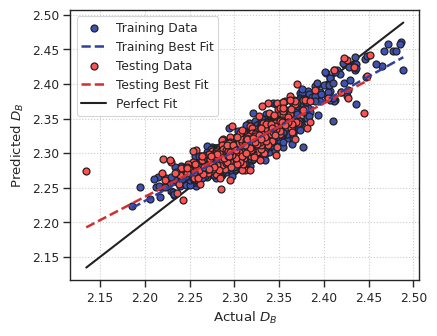

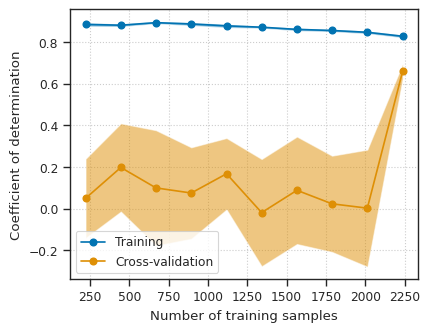

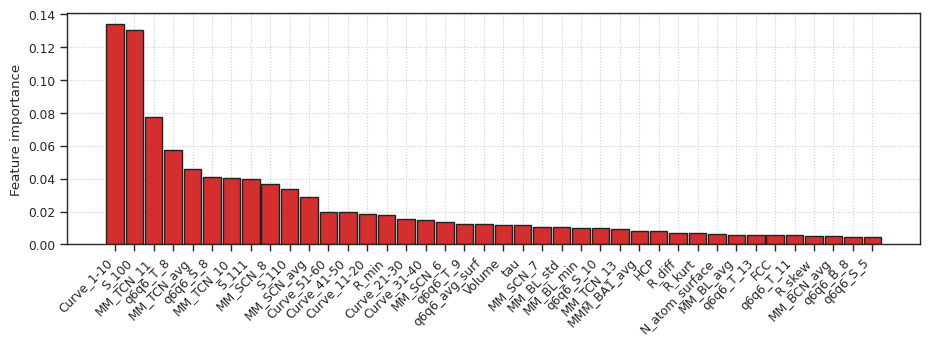

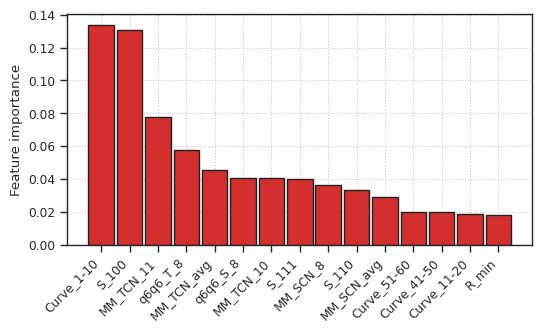

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.453
    Cross-validation score: 0.361 +/- 0.071
    Testing score:
      Mean absolute error: 0.017411
      Mean squared error: 0.000516
      Root mean squared error: 0.022710
      Coefficient of determination: 0.421


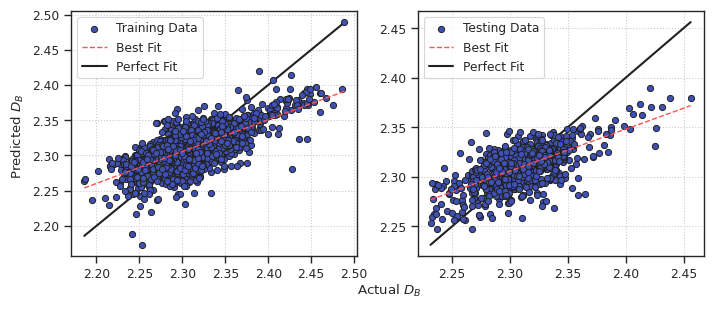

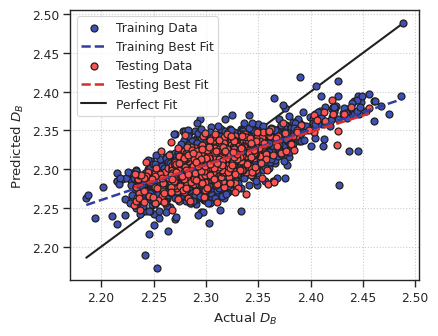

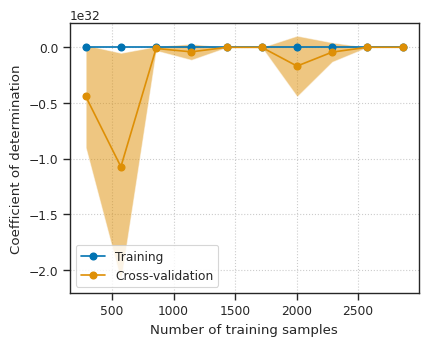

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.037
    R_diff: 0.053
    R_min: 0.017
    MM_TCN_avg: 0.143
    MM_BL_avg: 0.009
    MM_BL_min: 0.004
    ICOS: 0.003
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.006
    MM_TCN_16: 0.009
    MM_TCN_17: 0.001
    MM_BCN_8: 0.004

Dataset: MNP
Best score: 0.695
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.813
    Cross-validation score: 0.695 +/- 0.038
    Testing score:
      Mean absolute error: 0.011492
      Mean squared error: 0.000247
      Root mean squared error: 0.015727
      Coefficient of determination: 0.722


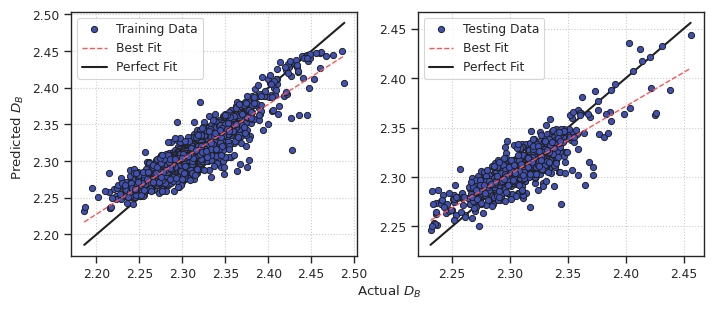

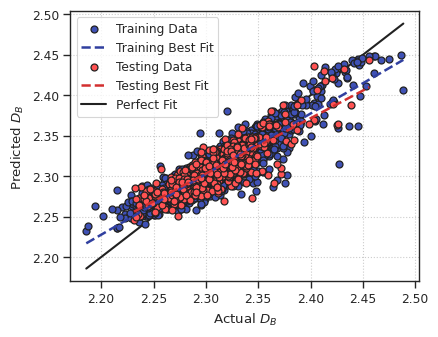

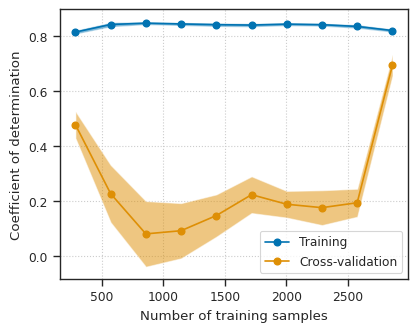

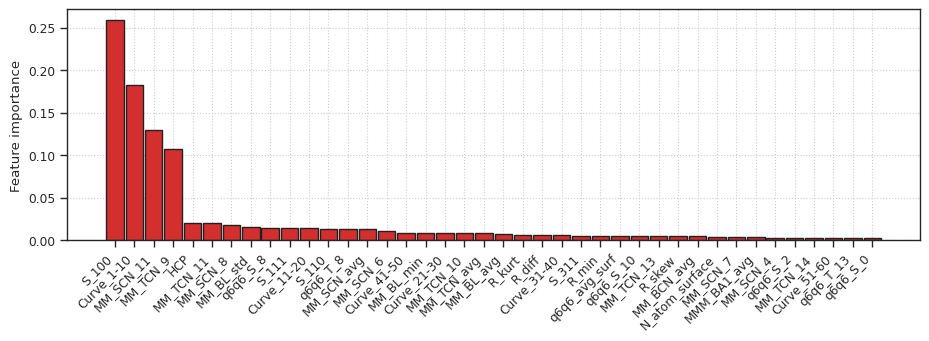

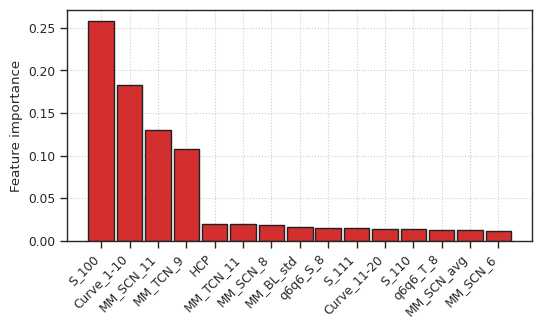

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.457
    Cross-validation score: 0.388 +/- 0.013
    Testing score:
      Mean absolute error: 0.017022
      Mean squared error: 0.000507
      Root mean squared error: 0.022510
      Coefficient of determination: 0.476


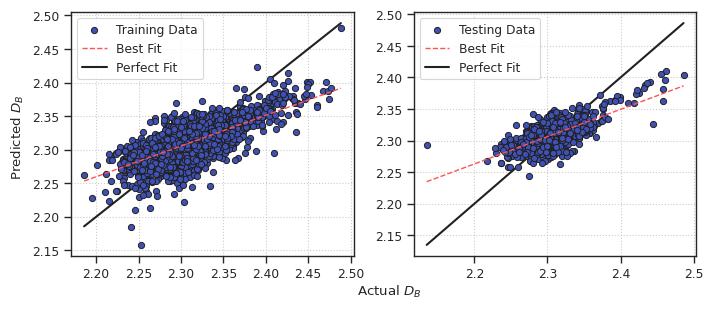

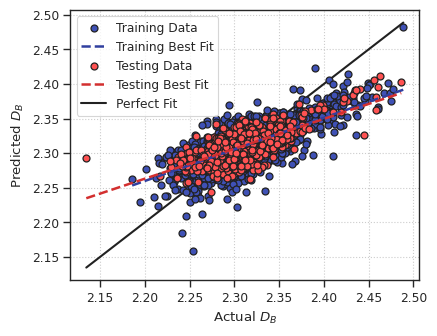

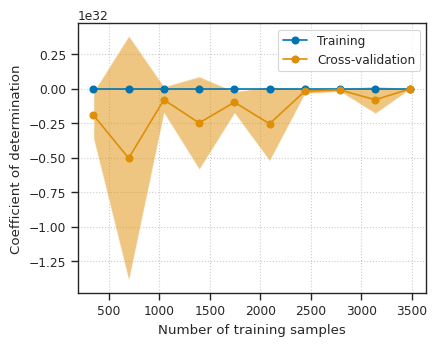

  Feature coefficients:
    time: 0.002
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.033
    R_diff: 0.057
    R_min: 0.033
    MM_TCN_avg: 0.155
    MM_BCN_avg: 0.004
    MM_BL_avg: 0.008
    MM_BL_min: 0.003
    ICOS: 0.004
    MM_SCN_2: 0.001
    MM_SCN_12: 0.001
    MM_SCN_13: 0.002
    MM_SCN_14: 0.008
    MM_TCN_16: 0.006
    q6q6_T_10: 0.229
    MM_BCN_7: 0.003
    MM_BCN_8: 0.005

Dataset: MNP
Best score: 0.710
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.810
    Cross-validation score: 0.710 +/- 0.031
    Testing score:
      Mean absolute error: 0.011546
      Mean squared error: 0.000254
      Root mean squared error: 0.015941
      Coefficient of determination: 0.737


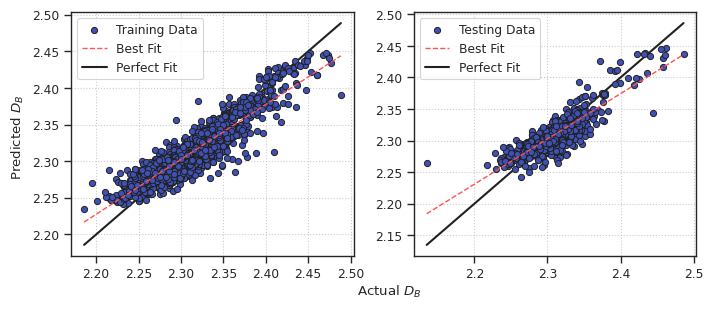

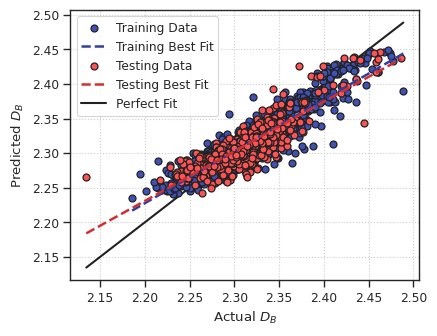

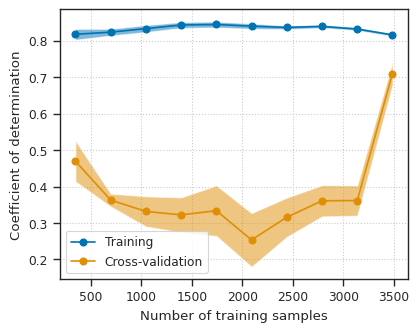

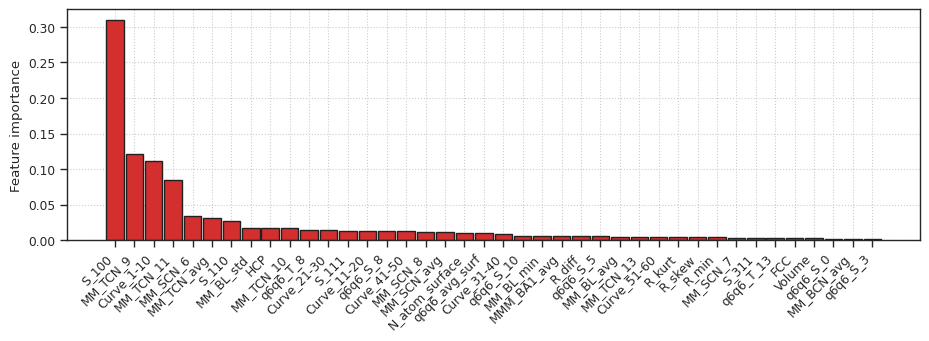

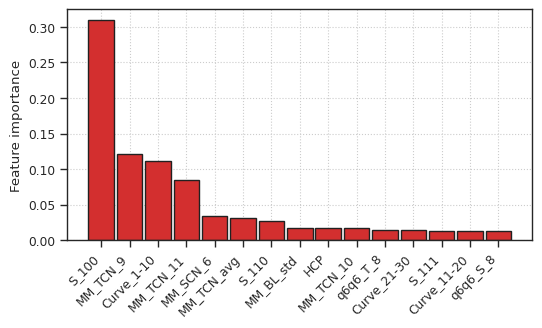

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Removing the features with null values...
  Original number of features: 76
  Total number of features left: 76

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.461
    Cross-validation score: 0.390 +/- 0.043
    Testing score:
      Mean absolute error: 0.017495
      Mean squared error: 0.000513
      Root mean squared error: 0.022650
      Coefficient of determination: 0.470


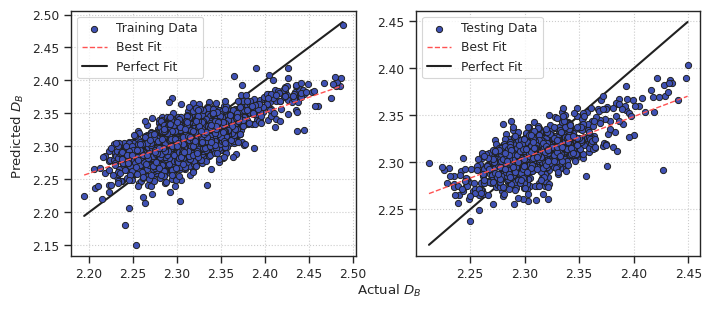

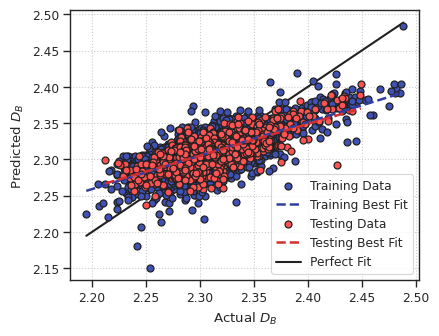

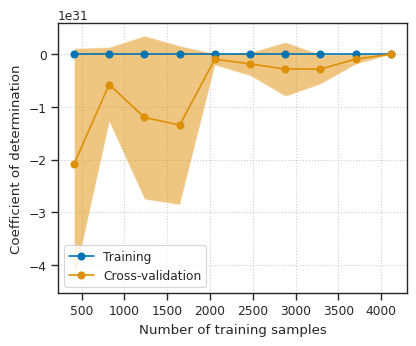

  Feature coefficients:
    time: 0.003
    q6q6_avg_surf: 0.001
    N_atom_surface: 0.035
    R_diff: 0.065
    R_min: 0.042
    MM_TCN_avg: 0.154
    MM_BCN_avg: 0.007
    MM_BL_avg: 0.006
    MM_BL_std: 0.002
    MM_BL_min: 0.003
    ICOS: 0.003
    MM_SCN_12: 0.001
    MM_SCN_13: 0.003
    MM_SCN_14: 0.006
    MM_SCN_15: 0.004
    MM_TCN_16: 0.006
    MM_TCN_17: 0.002
    q6q6_T_10: 0.131
    MM_BCN_7: 0.006
    MM_BCN_8: 0.006

Dataset: MNP
Best score: 0.710
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9463772865706722, 'max_leaf_nodes': 94, 'min_samples_leaf': 5, 'min_samples_split': 19, 'n_estimators': 79}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.806
    Cross-validation score: 0.710 +/- 0.022
    Testing score:
      Mean absolute error: 0.011731
      Mean squared error: 0.000262
      Root mean squared error: 0.016194
      Coefficient of determination: 0.729


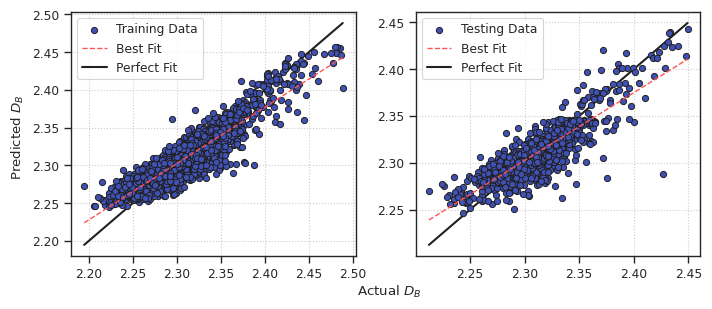

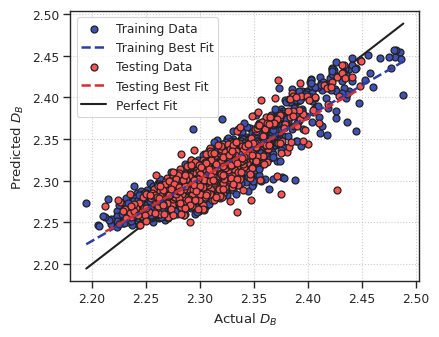

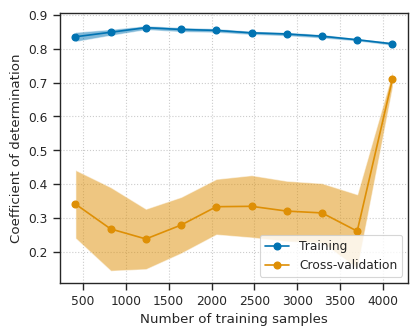

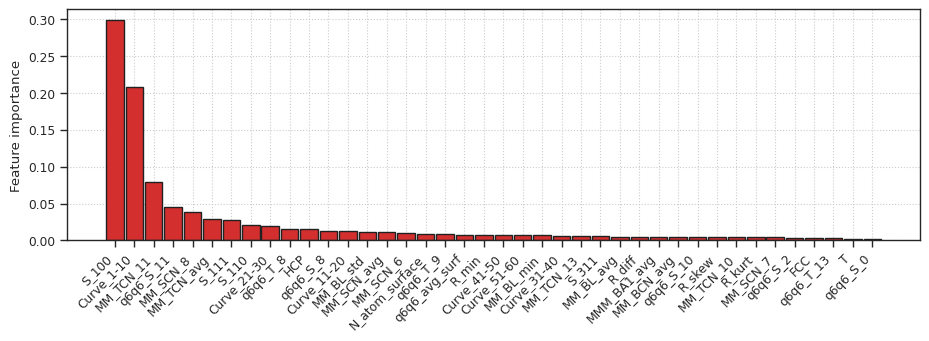

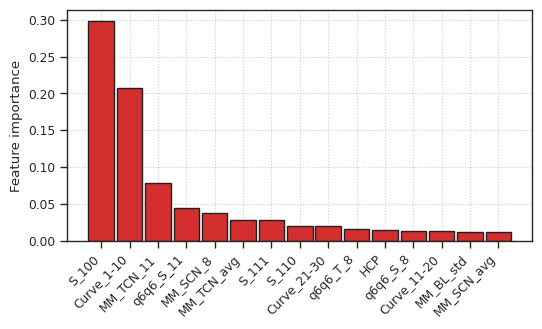

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.444
    Cross-validation score: 0.392 +/- 0.026
    Testing score:
      Mean absolute error: 0.017668
      Mean squared error: 0.000534
      Root mean squared error: 0.023103
      Coefficient of determination: 0.421


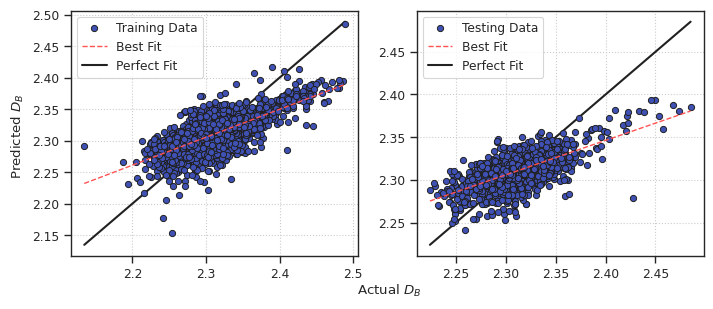

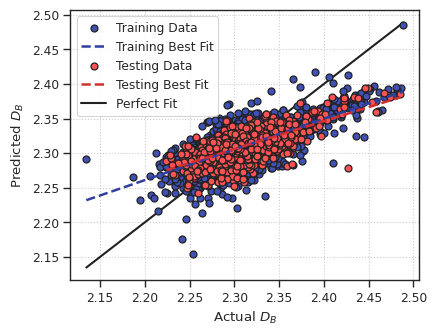

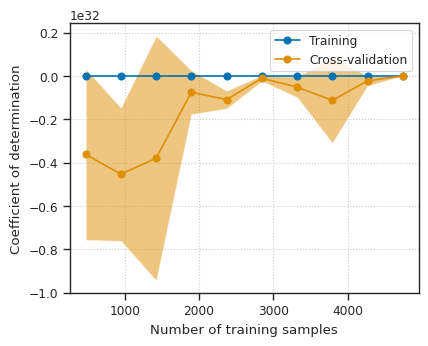

  Feature coefficients:
    time: 0.002
    N_atom_surface: 0.041
    R_diff: 0.059
    R_min: 0.020
    MM_TCN_avg: 0.164
    MM_BL_avg: 0.008
    MM_BL_min: 0.004
    ICOS: 0.006
    MM_SCN_2: 0.001
    MM_SCN_12: 0.001
    MM_SCN_13: 0.004
    MM_SCN_14: 0.007
    MM_TCN_16: 0.010
    MM_TCN_17: 0.001
    MM_BCN_6: 0.003
    MM_BCN_7: 0.001
    MM_BCN_8: 0.007

Dataset: MNP
Best score: 0.705
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.705 +/- 0.018
    Testing score:
      Mean absolute error: 0.011835
      Mean squared error: 0.000263
      Root mean squared error: 0.016223
      Coefficient of determination: 0.715


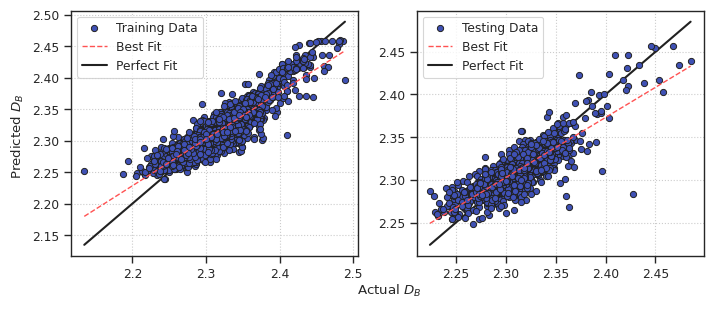

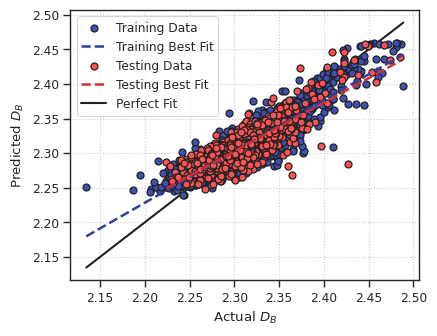

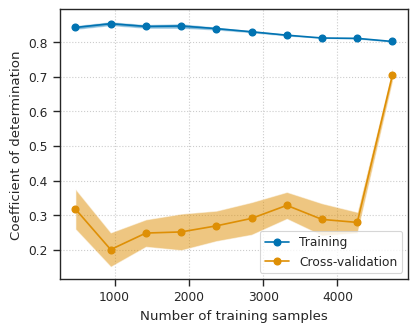

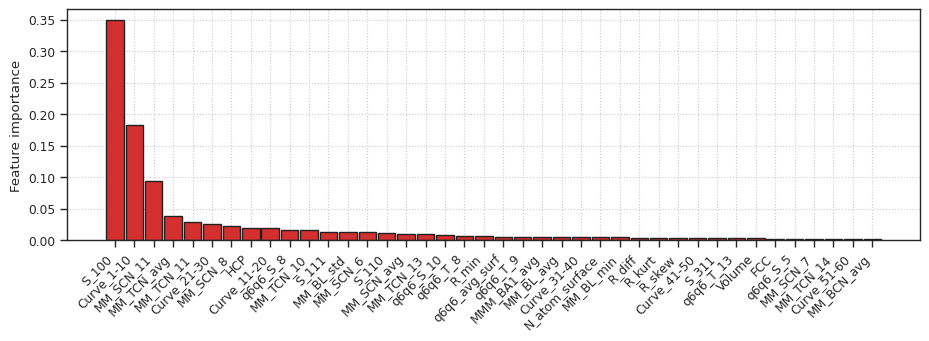

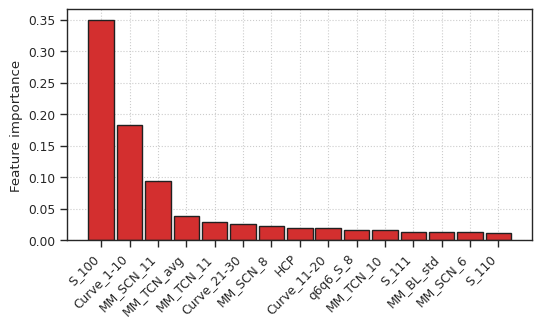

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.384
    Cross-validation score: 0.246 +/- 0.120
    Testing score:
      Mean absolute error: 0.017827
      Mean squared error: 0.000540
      Root mean squared error: 0.023228
      Coefficient of determination: 0.377


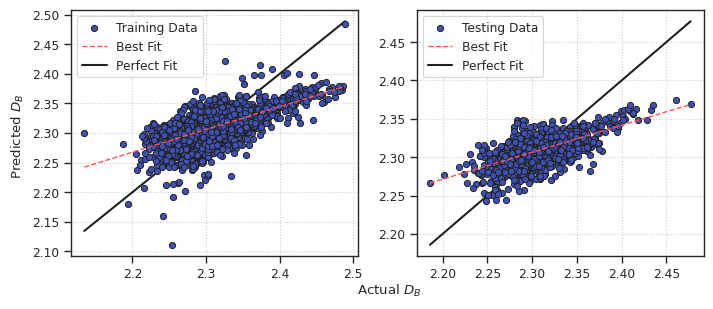

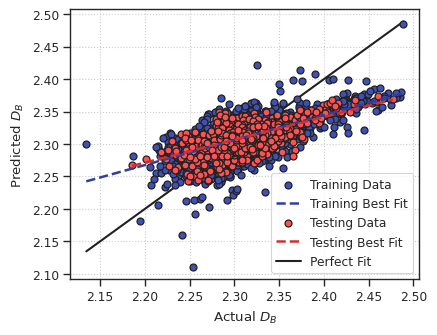

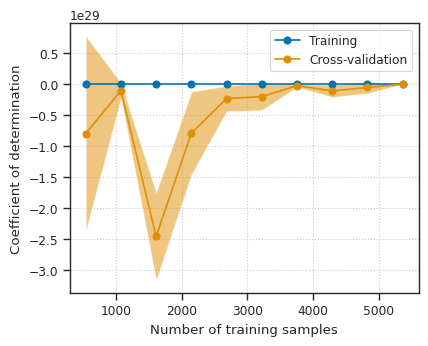

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.004
    Volume: 0.003
    R_diff: 0.026
    R_skew: 0.002
    MM_TCN_avg: 0.204
    MM_BCN_avg: 0.002
    MM_BL_avg: 0.010
    MM_BL_std: 0.004
    MM_BL_min: 0.012
    MM_SCN_13: 0.002
    MM_SCN_15: 0.010
    q6q6_S_3: 0.001
    MM_TCN_16: 0.004
    q6q6_T_10: 0.246
    MM_BCN_9: 0.002

Dataset: MNP


In [ ]:
reducedMNPFeatsDF = loadFeats(f"{DATA_DIR}/reducedMNP_nanoparticle_data.pkl")

CORR_THRESH = 0.9

for i in range(NUM_RUNS):
    FIG_NAME_APPENDIX = f"minmax_{i}"
    # Data loading
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}NoArch.pickle")
    archMNPDF = MNPDF.loc[reducedMNPFeatsDF.index]
    MNPDF.drop(reducedMNPFeatsDF.index, inplace=True)
    
    # with open(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}.pickle", 'rb') as f:
    #     MNPDF = pickle.load(f)  # MNPDF1
    # with open(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}.pickle", 'rb') as f:
    #     MNPDF2 = pickle.load(f)
    # Total Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :].iloc[:, :-1]
    # Formation Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :]
    # MNPDF = MNPDF.drop(['Total_E'], axis=1)
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    archMNPNoNullDF = rmNullFeats(featsDF=archMNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNP = pd.concat([XtrainMNP, archMNPDF.iloc[:, :-1]], axis=0)
    yTrainMNP = pd.concat([yTrainMNP, archMNPDF.iloc[:, -1]], axis=0)
    
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull = pd.concat([XtrainMNPNoNull, archMNPNoNullDF.iloc[:, :-1]], axis=0)
    yTrainMNPNoNull = pd.concat([yTrainMNPNoNull, archMNPNoNullDF.iloc[:, -1]], axis=0)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Removing the features with null values...
  Original number of features: 75
  Total number of features left: 75

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.384
    Cross-validation score: 0.246 +/- 0.120
    Testing score:
      Mean absolute error: 0.017827
      Mean squared error: 0.000540
      Root mean squared error: 0.023228
      Coefficient of determination: 0.377


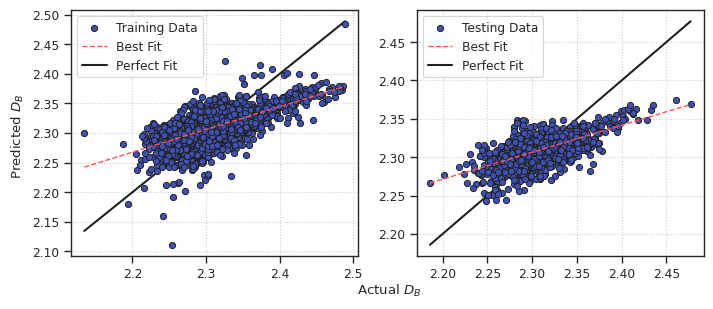

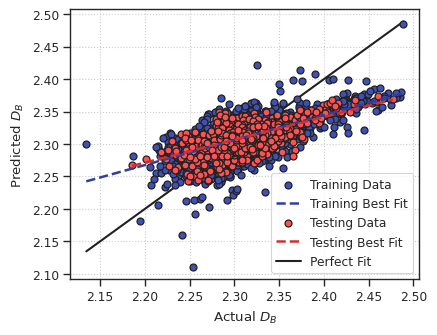

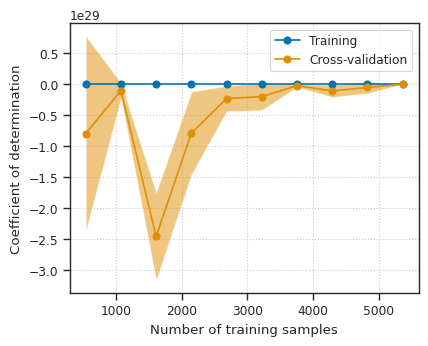

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.004
    Volume: 0.003
    R_diff: 0.026
    R_skew: 0.002
    MM_TCN_avg: 0.204
    MM_BCN_avg: 0.002
    MM_BL_avg: 0.010
    MM_BL_std: 0.004
    MM_BL_min: 0.012
    MM_SCN_13: 0.002
    MM_SCN_15: 0.010
    q6q6_S_3: 0.001
    MM_TCN_16: 0.004
    q6q6_T_10: 0.246
    MM_BCN_9: 0.002

Dataset: MNP
Best score: 0.718
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9274486641154054, 'max_leaf_nodes': 91, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 84}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.718 +/- 0.015
    Testing score:
      Mean absolute error: 0.011740
      Mean squared error: 0.000256
      Root mean squared error: 0.016008
      Coefficient of determination: 0.704


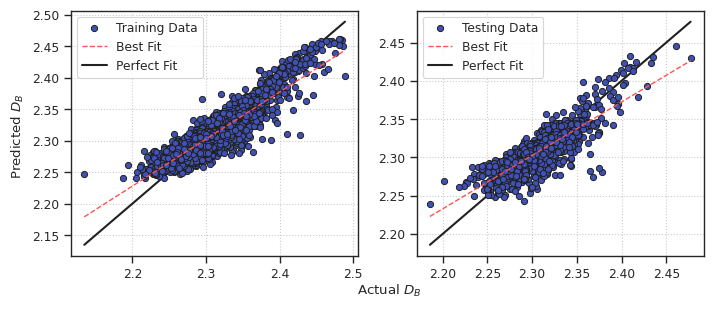

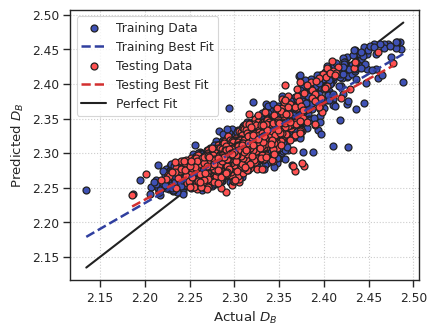

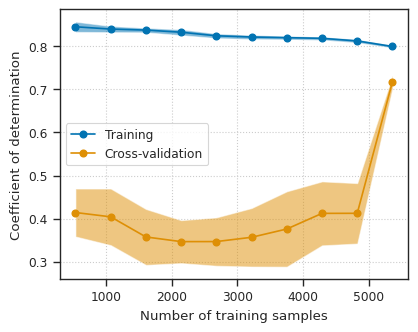

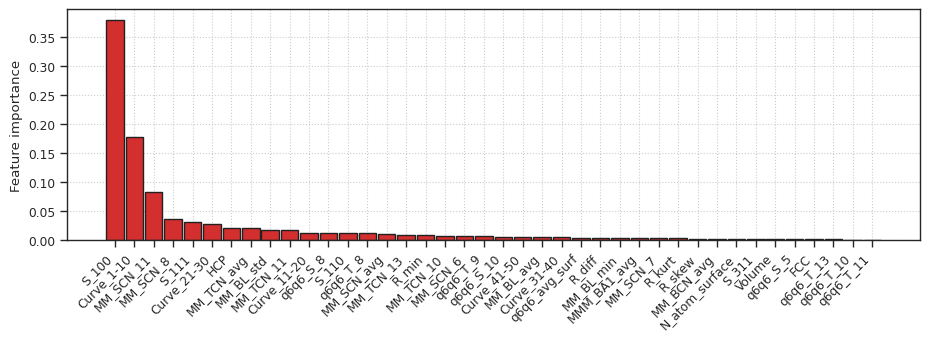

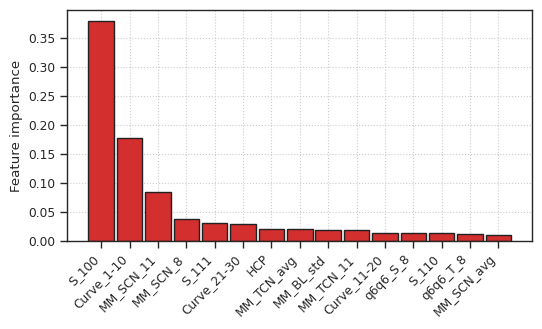

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Removing the features with null values...
  Original number of features: 74
  Total number of features left: 74

Applying minmax scaling to feature values...
Applying minmax scaling to feature values...

Dataset: MNP
  Running LRR
  Trained and tested using Coefficient of determination.
    Training score: 0.367
    Cross-validation score: 0.105 +/- 0.270
    Testing score:
      Mean absolute error: 0.018726
      Mean squared error: 0.000585
      Root mean squared error: 0.024184
      Coefficient of determination: 0.374


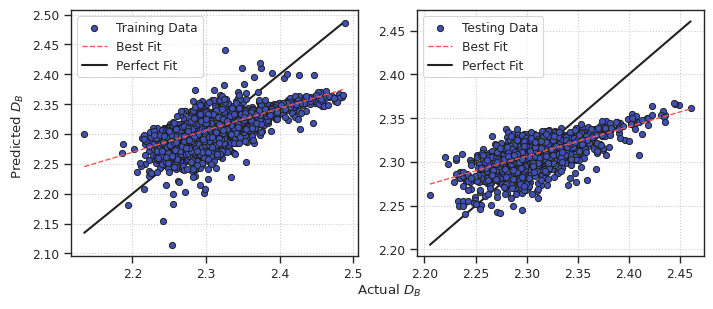

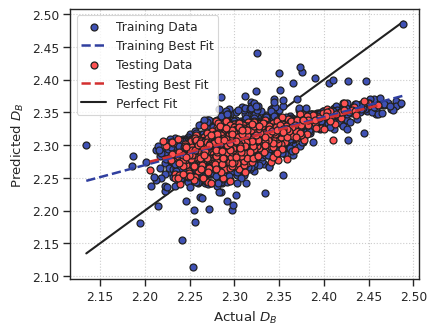

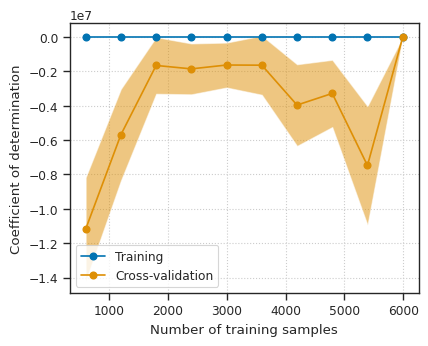

  Feature coefficients:
    time: 0.001
    q6q6_avg_surf: 0.008
    N_atom_surface: 0.005
    Volume: 0.002
    R_diff: 0.013
    R_skew: 0.032
    MM_TCN_avg: 0.213
    MM_BL_avg: 0.009
    MM_BL_std: 0.005
    MM_BL_min: 0.012
    MM_SCN_13: 0.004
    MM_SCN_14: 0.007
    MM_SCN_15: 0.011
    MM_TCN_16: 0.011
    MM_TCN_17: 0.001
    MM_BCN_9: 0.002

Dataset: MNP
Best score: 0.721
Best parameter combination: {'criterion': 'squared_error', 'max_depth': 9, 'max_features': 0.9463772865706722, 'max_leaf_nodes': 94, 'min_samples_leaf': 5, 'min_samples_split': 19, 'n_estimators': 79}
  Running RFR
  Trained and tested using Coefficient of determination.
    Training score: 0.793
    Cross-validation score: 0.721 +/- 0.017
    Testing score:
      Mean absolute error: 0.011738
      Mean squared error: 0.000257
      Root mean squared error: 0.016039
      Coefficient of determination: 0.725


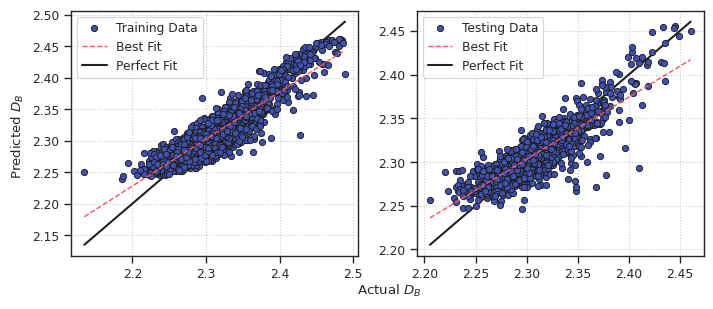

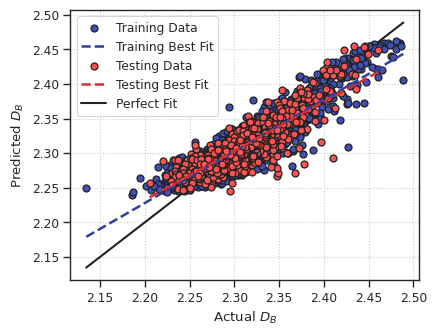

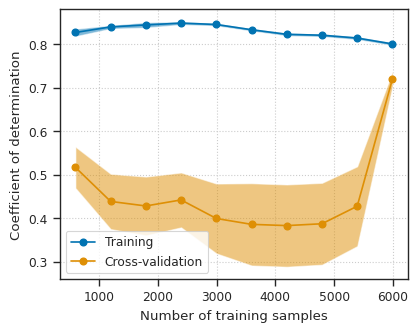

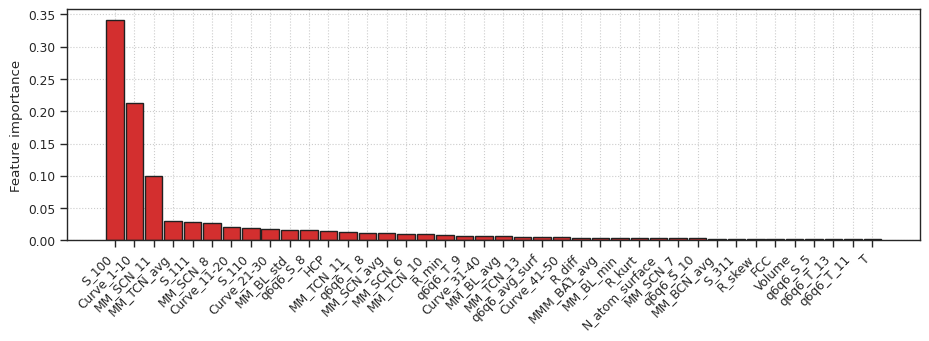

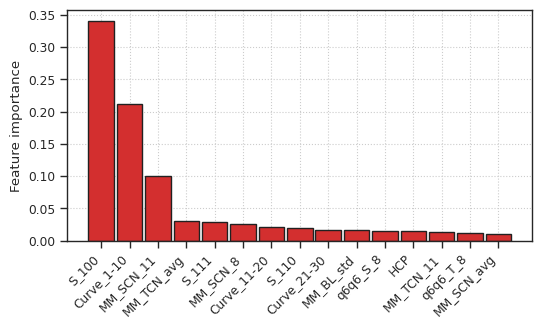

In [11]:
reducedMNPFeatsDF = loadFeats(f"{DATA_DIR}/reducedMNP_nanoparticle_data.pkl")

CORR_THRESH = 0.9

for i in range(NUM_RUNS):
    if i < 8: continue
    FIG_NAME_APPENDIX = f"minmax_{i}"
    # Data loading
    MNPDF = pd.read_pickle(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}NoArch.pickle")
    archMNPDF = MNPDF.loc[reducedMNPFeatsDF.index]
    MNPDF.drop(reducedMNPFeatsDF.index, inplace=True)
    
    # with open(f"{DATA_DIR}/processedMNPdataNoC{int(CORR_THRESH * 100)}run{i+1}.pickle", 'rb') as f:
    #     MNPDF = pickle.load(f)  # MNPDF1
    # with open(f"{DATA_DIR}/processedMNPEdataNoC{int(CORR_THRESH * 100)}.pickle", 'rb') as f:
    #     MNPDF2 = pickle.load(f)
    # Total Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :].iloc[:, :-1]
    # Formation Energy
    # MNPDF = MNPDF2.iloc[MNPDF1.index, :]
    # MNPDF = MNPDF.drop(['Total_E'], axis=1)
    
    MNPNoNullDF = rmNullFeats(featsDF=MNPDF, verbose=VERBOSE)
    archMNPNoNullDF = rmNullFeats(featsDF=archMNPDF, verbose=VERBOSE)
    
    XtrainMNP, XtestMNP, yTrainMNP, yTestMNP = splitScaleData(df=MNPDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNP = pd.concat([XtrainMNP, archMNPDF.iloc[:, :-1]], axis=0)
    yTrainMNP = pd.concat([yTrainMNP, archMNPDF.iloc[:, -1]], axis=0)
    
    XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull = splitScaleData(df=MNPNoNullDF, polyFeats=POLY_FEATS, scaling=SCALING, verbose=VERBOSE)
    XtrainMNPNoNull = pd.concat([XtrainMNPNoNull, archMNPNoNullDF.iloc[:, :-1]], axis=0)
    yTrainMNPNoNull = pd.concat([yTrainMNPNoNull, archMNPNoNullDF.iloc[:, -1]], axis=0)
    
    X_Y_MNPS = {'WithNull': {'MNP': (XtrainMNP, XtestMNP, yTrainMNP, yTestMNP)}, 
                'NoNull': {'MNP': (XtrainMNPNoNull, XtestMNPNoNull, yTrainMNPNoNull, yTestMNPNoNull)}}

    # Linear Regression
    hasMissingVals, modelName = 'NoNull', 'LRR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
        
        linReg = LinearRegression(positive=False, fit_intercept=True, 
                                  copy_X=True, n_jobs=NUM_JOBS)  # No speedup from n_jobs here as n_target=1 and positive=False
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        yPredTrainLinR, yPredTestLinR, linReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                         model=linReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                         numFeat=20, isReg=True, showFeatCoef=True, plotFeatImp=False, verbose=True, showFig=True)

    # Random Forest
    hasMissingVals, modelName = 'WithNull', 'RFR'
    for mnp in X_Y_MNPS[hasMissingVals].keys():
        print(f"\nDataset: {mnp}")
        # if exists(f"{DATA_DIR}/hpTune{mnp}{modelName}.pickle"):
        #     print('Already done, skipping...')
        #     continue
        Xtrain, Xtest, yTrain, yTest = X_Y_MNPS[hasMissingVals][mnp]
    
        rfReg = RandomForestRegressor(n_estimators=40, criterion='squared_error', max_depth=None, 
                                      max_features=1.0, max_leaf_nodes=None, min_samples_split=2, min_samples_leaf=1, 
                                      min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0, n_jobs=NUM_JOBS, random_state=RANDOM_SEED, verbose=0, 
                                      bootstrap=True, oob_score=False, warm_start=False, ccp_alpha=0.0, max_samples=None, monotonic_cst=None)
        paramGrid = {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], 
                     'n_estimators': stats.randint(low=3, high=100), 
                     'max_depth' : stats.randint(low=1, high=10), 
                     'max_features': stats.uniform(loc=0.1, scale=0.9), 
                     'max_leaf_nodes': stats.randint(low=5, high=100),
                     'min_samples_split': stats.randint(low=2, high=20), 
                     'min_samples_leaf': stats.randint(low=1, high=10)}
        cv = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
        searchResults = hyperparamTune(rfReg, paramGrid, Xtrain, yTrain, scoringMetric='r2', cv=cv, numIter=1000)
        with open(f"{DATA_DIR}/hpTune{mnp}{modelName}run{i}.pickle", 'wb') as f:
            pickle.dump(searchResults, f)
    
        rfReg = searchResults.best_estimator_
        yPredTrainRFR, yPredTestRFR, rfReg = runModel(Xtrain, yTrain, Xtest, yTest, cv,
                                                      model=rfReg, modelName=modelName, datasetName=mnp, figNameAppendix=FIG_NAME_APPENDIX,
                                                      numFeat=15, showFeatCoef=False, plotFeatImp=True, verbose=True, showFig=True)
        # # Note: Set 'showFig' to False for cluster jobs!

# Model Performance Comparison

## Random 250 Instances

This table presents the performance metrics for Linear Regression and Random Forest models across 10 runs, after fitting to randomly sampled 250 instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>500</td> <td>69</td> <td>0.704</td> <td>-2e15$\pm$4e15</td> <td>0.698</td> <td>0.869</td> <td>0.619$\pm$0.049</td> <td>0.729</td>
  </tr>
  <tr>
    <td>2</td> <td>1477</td> <td>72</td> <td>0.671</td> <td>-2e15$\pm$3e15</td> <td>0.680</td> <td>0.844</td> <td>0.697$\pm$0.047</td> <td>0.683</td>
  </tr>
  <tr>
    <td>3</td> <td>2455</td> <td>72</td> <td>0.727</td> <td>0.702$\pm$0.028</td> <td>0.655</td> <td>0.858</td> <td>0.746$\pm$0.043</td> <td>0.705</td>
  </tr>
  <tr>
    <td>4</td> <td>3433</td> <td>71</td> <td>0.697</td> <td>0.670$\pm$0.048</td> <td>0.674</td> <td>0.829</td> <td>0.721$\pm$0.049</td> <td>0.702</td>
  </tr>
  <tr>
    <td>5</td> <td>4411</td> <td>73</td> <td>0.693</td> <td>-9e18$\pm$2e19</td> <td>0.675</td> <td>0.823</td> <td>0.734$\pm$0.017</td> <td>0.730</td>
  </tr>
  <tr>
    <td>6</td> <td>5388</td> <td>72</td> <td>0.697</td> <td>0.684$\pm$0.026</td> <td>0.678</td> <td>0.815</td> <td>0.728$\pm$0.025</td> <td>0.741</td>
  </tr>
  <tr>
    <td>7</td> <td>6366</td> <td>73</td> <td>0.680</td> <td>0.663$\pm$0.036</td> <td>0.705</td> <td>0.798</td> <td>0.719$\pm$0.035</td> <td>0.757</td>
  </tr>
  <tr>
    <td>8</td> <td>7344</td> <td>73</td> <td>0.689</td> <td>0.679$\pm$0.018</td> <td>0.628</td> <td>0.803</td> <td>0.734$\pm$0.027</td> <td>0.692</td>
  </tr>
  <tr>
    <td>9</td> <td>8322</td> <td>74</td> <td>0.688</td> <td>0.680$\pm$0.023</td> <td>0.682</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td>
  </tr>
  <tr>
    <td>10</td> <td>9300</td> <td>73</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td> <td>0.XXX</td> <td>0.XXX$\pm$0.XXX</td> <td>0.XXX</td>
  </tr>
</table>


## Extra Instances

This table presents the performance metrics for Linear Regression and Random Forest models across 10 runs, after fitting to datasets consisting of most archetypal 250 instances and randomly sampled instances.

<table>
  <tr>
    <th rowspan="2">Run</th>
    <th rowspan="2">Number of Instances</th>
    <th rowspan="2">Number of Features</th>
    <th colspan="3">Linear Regression</th>
    <th colspan="3">Random Forest</th>
  </tr>
  <tr>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
    <th>Training Score</th>
    <th>Cross Validation Score</th>
    <th>Testing Score</th>
  </tr>
  <tr>
    <td>1</td> <td>500</td> <td>76</td> <td>0.531</td> <td>0.223$\pm$0.210</td> <td>0.344</td> <td>0.826</td> <td>0.500$\pm$0.052</td> <td>0.225</td>
  </tr>
  <tr>
    <td>2</td> <td>1477</td> <td>74</td> <td>0.406</td> <td>0.290$\pm$0.078</td> <td>0.295</td> <td>0.834</td> <td>0.633$\pm$0.026</td> <td>0.646</td>
  </tr>
  <tr>
    <td>3</td> <td>2455</td> <td>74</td> <td>0.446</td> <td>0.366$\pm$0.056</td> <td>0.431</td> <td>0.824</td> <td>0.631$\pm$0.029</td> <td>0.658</td>
  </tr>
  <tr>
    <td>4</td> <td>3433</td> <td>75</td> <td>0.449</td> <td>0.348$\pm$0.075</td> <td>0.461</td> <td>0.813</td> <td>0.660$\pm$0.036</td> <td>0.717</td>
  </tr>
  <tr>
    <td>5</td> <td>4411</td> <td>74</td> <td>0.453</td> <td>0.361$\pm$0.071</td> <td>0.421</td> <td>0.813</td> <td>0.695$\pm$0.038</td> <td>0.722</td>
  </tr>
  <tr>
    <td>6</td> <td>5388</td> <td>74</td> <td>0.457</td> <td>0.388$\pm$0.013</td> <td>0.476</td> <td>0.810</td> <td>0.710$\pm$0.031</td> <td>0.737</td>
  </tr>
  <tr>
    <td>7</td> <td>6366</td> <td>75</td> <td>0.461</td> <td>0.390$\pm$0.043</td> <td>0.470</td> <td>0.806</td> <td>0.710$\pm$0.022</td> <td>0.729</td>
  </tr>
  <tr>
    <td>8</td> <td>7344</td> <td>74</td> <td>0.444</td> <td>0.392$\pm$0.026</td> <td>0.421</td> <td>0.793</td> <td>0.705$\pm$0.018</td> <td>0.715</td>
  </tr>
  <tr>
    <td>9</td> <td>8322</td> <td>74</td> <td>0.384</td> <td>0.246$\pm$0.120</td> <td>0.377</td> <td>0.793</td> <td>0.718$\pm$0.015</td> <td>0.704</td>
  </tr>
  <tr>
    <td>10</td> <td>9300</td> <td>73</td> <td>0.367</td> <td>0.105$\pm$0.270</td> <td>0.374</td> <td>0.793</td> <td>0.721$\pm$0.017</td> <td>0.725</td>
  </tr>
</table>
